In [ ]:
!unzip /content/drive/MyDrive/data.zip

In [ ]:
import pandas as pd
import numpy as np
import sys

import string
import re
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [38]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#@title greek stopwords
stopGreek = ['αδιακοπα', 'αδιάκοπα', 'αι', 'άι', 'ακομα', 'ακόμα', 'ακομη', 'ακόμη', 'ακριβωσ', 'ακριβως', 'ακριβώσ', 'ακριβώς', 'αληθεια', 'αλήθεια', 'αλήθειά', 'αληθινα', 'αληθινά', 'αλλα', 'αλλά', 'άλλα', 'αλλαχου', 'αλλαχού', 'αλλεσ', 'αλλες', 'άλλεσ', 'άλλες', 'αλλη', 'άλλη', 'αλλην', 'άλλην', 'αλλησ', 'αλλης', 'άλλησ', 'άλλης', 'αλλιωσ', 'αλλιως', 'αλλιώσ', 'αλλιώς', 'αλλιωτικα', 'αλλιώτικα', 'αλλο', 'άλλο', 'αλλοι', 'άλλοι', 'αλλοιωσ', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'άλλον', 'αλλοσ', 'αλλος', 'άλλοσ', 'άλλος', 'αλλοτε', 'άλλοτε', 'αλλου', 'αλλού', 'αλλουσ', 'αλλους', 'άλλουσ', 'άλλους', 'αλλων', 'άλλων', 'αμα', 'άμα', 'αμεσα', 'άμεσα', 'αμεσωσ', 'αμεσως', 'αμέσωσ', 'αμέσως', 'αν', 'ανα', 'ανά', 'αναμεσα', 'ανάμεσα', 'αναμεταξυ', 'αναμεταξύ', 'ανευ', 'άνευ', 'αντι', 'αντί', 'αντιπερα', 'αντιπέρα', 'αντίπερα', 'αντισ', 'αντις', 'αντίσ', 'αντίς', 'ανω', 'άνω', 'ανωτερω', 'ανωτέρω', 'αξαφνα', 'άξαφνα', 'απ', 'απεναντι', 'απέναντι', 'απο', 'από', 'αποψε', 'απόψε', 'αρα', 'άρα', 'αραγε', 'άραγε', 'αργα', 'αργά', 'αργοτερο', 'αργότερο', 'αριστερα', 'αριστερά', 'αρκετα', 'αρκετά', 'αρχικα', 'αρχικά', 'ασ', 'ας', 'αυριο', 'αύριο', 'αυτα', 'αυτά', 'αυτεσ', 'αυτες', 'αυτέσ', 'αυτές', 'αυτη', 'αυτή', 'αυτην', 'αυτήν', 'αυτησ', 'αυτης', 'αυτήσ', 'αυτής', 'αυτο', 'αυτό', 'αυτοι', 'αυτοί', 'αυτον', 'αυτόν', 'αυτοσ', 'αυτος', 'αυτόσ', 'αυτός', 'αυτου', 'αυτού', 'αυτουσ', 'αυτους', 'αυτούσ', 'αυτούς', 'αυτων', 'αυτών', 'αφοτου', 'αφότου', 'αφου', 'αφού', 'βεβαια', 'βέβαια', 'βεβαιοτατα', 'βεβαιότατα', 'γι', 'για', 'γρηγορα', 'γρήγορα', 'γυρω', 'γύρω', 'δα', 'δε', 'δεινα', 'δεινά', 'δεν', 'δεξια', 'δεξιά', 'δηθεν', 'δήθεν', 'δηλαδη', 'δηλαδή', 'δι', 'δια', 'διαρκωσ', 'διαρκως', 'διαρκώσ', 'διαρκώς', 'δικα', 'δικά', 'δικο', 'δικό', 'δικοι', 'δικοί', 'δικοσ', 'δικος', 'δικόσ', 'δικός', 'δικου', 'δικού', 'δικουσ', 'δικους', 'δικούσ', 'δικούς', 'διολου', 'διόλου', 'διπλα', 'δίπλα', 'διχωσ', 'διχως', 'δίχωσ', 'δίχως', 'εαν', 'εάν', 'εαυτο', 'εαυτό', 'εαυτον', 'εαυτόν', 'εαυτου', 'εαυτού', 'εαυτουσ', 'εαυτους', 'εαυτούσ', 'εαυτούς', 'εαυτων', 'εαυτών', 'εγκαιρα', 'έγκαιρα', 'εγκαιρωσ', 'εγκαιρως', 'εγκαίρωσ', 'εγκαίρως', 'εγω', 'εγώ', 'εδω', 'εδώ', 'ειδεμη', 'ειδεμή', 'ειθε', 'είθε', 'ειμαι', 'είμαι', 'ειμαστε', 'είμαστε', 'ειναι', 'είναι', 'εισ', 'εις', 'εισαι', 'είσαι', 'εισαστε', 'είσαστε', 'ειστε', 'είστε', 'ειτε', 'είτε', 'ειχα', 'είχα', 'ειχαμε', 'είχαμε', 'ειχαν', 'είχαν', 'ειχατε', 'είχατε', 'ειχε', 'είχε', 'ειχεσ', 'ειχες', 'είχεσ', 'είχες', 'εκαστα', 'έκαστα', 'εκαστεσ', 'εκαστες', 'έκαστεσ', 'έκαστες', 'εκαστη', 'εκάστη', 'έκαστη', 'εκαστην', 'εκάστην', 'εκαστησ', 'εκαστης', 'εκάστησ', 'εκάστης', 'έκαστησ', 'έκαστης', 'εκαστο', 'έκαστο', 'εκαστοι', 'έκαστοι', 'εκαστον', 'έκαστον', 'εκαστοσ', 'εκαστος', 'έκαστοσ', 'έκαστος', 'εκαστου', 'εκάστου', 'έκαστου', 'εκαστουσ', 'εκαστους', 'έκαστουσ', 'έκαστους', 'εκαστων', 'εκάστων', 'έκαστων', 'εκει', 'εκεί', 'εκεινα', 'εκείνα', 'εκεινεσ', 'εκεινες', 'εκείνεσ', 'εκείνες', 'εκεινη', 'εκείνη', 'εκεινην', 'εκείνην', 'εκεινησ', 'εκεινης', 'εκείνησ', 'εκείνης', 'εκεινο', 'εκείνο', 'εκεινοι', 'εκείνοι', 'εκεινον', 'εκείνον', 'εκεινοσ', 'εκεινος', 'εκείνοσ', 'εκείνος', 'εκεινου', 'εκείνου', 'εκεινουσ', 'εκεινους', 'εκείνουσ', 'εκείνους', 'εκεινων', 'εκείνων', 'εκτοσ', 'εκτος', 'εκτόσ', 'εκτός', 'εμασ', 'εμας', 'εμάσ', 'εμάς', 'εμεισ', 'εμεις', 'εμείσ', 'εμείς', 'εμενα', 'εμένα', 'εμπροσ', 'εμπρος', 'εμπρόσ', 'εμπρός', 'εν', 'ενα', 'ένα', 'εναν', 'έναν', 'ενασ', 'ενας', 'ένασ', 'ένας', 'ενοσ', 'ενος', 'ενόσ', 'ενός', 'εντελωσ', 'εντελως', 'εντελώσ', 'εντελώς', 'εντοσ', 'εντος', 'εντόσ', 'εντός', 'εντωμεταξυ', 'εντωμεταξύ', 'ενω', 'ενώ', 'εξ', 'εξαφνα', 'έξαφνα', 'εξησ', 'εξης', 'εξήσ', 'εξής', 'εξισου', 'εξίσου', 'εξω', 'έξω', 'επανω', 'επάνω', 'επειδη', 'επειδή', 'επειτα', 'έπειτα', 'επι', 'επί', 'επισησ', 'επισης', 'επίσησ', 'επίσης', 'επομενωσ', 'επομενως', 'επομένωσ', 'επομένως', 'εσασ', 'εσας', 'εσάσ', 'εσάς', 'εσεισ', 'εσεις', 'εσείσ', 'εσείς', 'εσενα', 'εσένα', 'εστω', 'έστω', 'εσυ', 'εσύ', 'εταίρασ', 'εταίρας', 'ετερα', 'ετέρα', 'έτερα', 'ετεραι', 'ετερασ', 'ετερας', 'ετερεσ', 'ετερες', 'έτερεσ', 'έτερες', 'ετερη', 'έτερη', 'ετερησ', 'ετερης', 'έτερησ', 'έτερης', 'ετερο', 'έτερο', 'ετεροι', 'έτεροι', 'ετερον', 'έτερον', 'ετεροσ', 'ετερος', 'έτεροσ', 'έτερος', 'ετερου', 'ετέρου', 'ετερουσ', 'ετερους', 'ετέρουσ', 'ετέρους', 'έτερουσ', 'έτερους', 'ετερων', 'ετέρων', 'έτερων', 'ετουτα', 'ετούτα', 'ετουτεσ', 'ετουτες', 'ετούτεσ', 'ετούτες', 'ετουτη', 'ετούτη', 'ετουτην', 'ετούτην', 'ετουτησ', 'ετουτης', 'ετούτησ', 'ετούτης', 'ετουτο', 'ετούτο', 'ετουτοι', 'ετούτοι', 'ετουτον', 'ετούτον', 'ετουτοσ', 'ετουτος', 'ετούτοσ', 'ετούτος', 'ετουτου', 'ετούτου', 'ετουτουσ', 'ετουτους', 'ετούτουσ', 'ετούτους', 'ετουτων', 'ετούτων', 'ετσι', 'έτσι', 'ευγε', 'εύγε', 'ευθυσ', 'ευθυς', 'ευθύσ', 'ευθύς', 'ευτυχωσ', 'ευτυχως', 'ευτυχώσ', 'ευτυχώς', 'εφεξησ', 'εφεξης', 'εφεξήσ', 'εφεξής', 'εχει', 'έχει', 'εχεισ', 'εχεις', 'έχεισ', 'έχεις', 'εχετε', 'έχετε', 'εχθεσ', 'εχθες', 'εχθέσ', 'εχθές', 'εχομε', 'έχομε', 'εχουμε', 'έχουμε', 'εχουν', 'έχουν', 'εχτεσ', 'εχτες', 'εχτέσ', 'εχτές', 'εχω', 'έχω', 'εωσ', 'εως', 'έωσ', 'έως', 'η', 'ή', 'ηδη', 'ήδη', 'ημασταν', 'ήμασταν', 'ημαστε', 'ήμαστε', 'ημουν', 'ήμουν', 'ησασταν', 'ήσασταν', 'ησαστε', 'ήσαστε', 'ησουν', 'ήσουν', 'ηταν', 'ήταν', 'ητανε', 'ήτανε', 'ητοι', 'ήτοι', 'ηττον', 'ήττον', 'θα', 'ι', 'ιδια', 'ίδια', 'ιδιαν', 'ιδίαν', 'ιδιασ', 'ιδιας', 'ιδίασ', 'ιδίας', 'ίδιασ', 'ίδιας', 'ιδιεσ', 'ιδιες', 'ίδιεσ', 'ίδιες', 'ιδιο', 'ίδιο', 'ιδιοι', 'ίδιοι', 'ιδιον', 'ίδιον', 'ιδιοσ', 'ιδιος', 'ίδιοσ', 'ίδιος', 'ιδιου', 'ίδιου', 'ιδιουσ', 'ιδιους', 'ιδίουσ', 'ιδίους', 'ίδιουσ', 'ίδιους', 'ιδιων', 'ιδίων', 'ίδιων', 'ιδιωσ', 'ιδιως', 'ιδίωσ', 'ιδίως', 'ιι', 'ιιι', 'ισαμε', 'ίσαμε', 'ισια', 'ίσια', 'ισωσ', 'ισως', 'ίσωσ', 'ίσως', 'καθε', 'κάθε', 'καθεμια', 'καθεμιά', 'καθεμία', 'καθεμιασ', 'καθεμιας', 'καθεμιάσ', 'καθεμιάς', 'καθεμίασ', 'καθεμίας', 'καθενα', 'καθένα', 'καθενασ', 'καθενας', 'καθένασ', 'καθένας', 'καθενοσ', 'καθενος', 'καθενόσ', 'καθενός', 'καθετι', 'καθετί', 'καθολου', 'καθόλου', 'καθωσ', 'καθως', 'καθώσ', 'καθώς', 'και', 'κακα', 'κακά', 'κακωσ', 'κακως', 'κακώσ', 'κακώς', 'καλα', 'καλά', 'καλωσ', 'καλως', 'καλώσ', 'καλώς', 'καμια', 'καμιά', 'καμία', 'καμιαν', 'καμιάν', 'καμίαν', 'καμιασ', 'καμιας', 'καμιάσ', 'καμιάς', 'καμίασ', 'καμίας', 'καμποσα', 'κάμποσα', 'καμποσεσ', 'καμποσες', 'κάμποσεσ', 'κάμποσες', 'καμποση', 'κάμποση', 'καμποσην', 'καμπόσην', 'κάμποσην', 'καμποσησ', 'καμποσης', 'καμπόσησ', 'καμπόσης', 'κάμποσησ', 'κάμποσης', 'καμποσο', 'κάμποσο', 'καμποσοι', 'καμπόσοι', 'κάμποσοι', 'καμποσον', 'κάμποσον', 'καμποσοσ', 'καμποσος', 'καμπόσοσ', 'καμπόσος', 'κάμποσοσ', 'κάμποσος', 'καμποσου', 'καμπόσου', 'κάμποσου', 'καμποσουσ', 'καμποσους', 'καμπόσουσ', 'καμπόσους', 'κάμποσουσ', 'κάμποσους', 'καμποσων', 'καμπόσων', 'κάμποσων', 'κανεισ', 'κανεις', 'κανείσ', 'κανείς', 'κανεν', 'κάνεν', 'κανενα', 'κανένα', 'κανεναν', 'κανέναν', 'κανενασ', 'κανενας', 'κανένασ', 'κανένας', 'κανενοσ', 'κανενος', 'κανενόσ', 'κανενός', 'καποια', 'κάποια', 'καποιαν', 'κάποιαν', 'καποιασ', 'καποιας', 'κάποιασ', 'κάποιας', 'καποιεσ', 'καποιες', 'κάποιεσ', 'κάποιες', 'καποιο', 'κάποιο', 'καποιοι', 'κάποιοι', 'καποιον', 'κάποιον', 'καποιοσ', 'καποιος', 'κάποιοσ', 'κάποιος', 'καποιου', 'κάποιου', 'καποιουσ', 'καποιους', 'κάποιουσ', 'κάποιους', 'καποιων', 'κάποιων', 'καποτε', 'κάποτε', 'καπου', 'κάπου', 'καπωσ', 'καπως', 'κάπωσ', 'κάπως', 'κατ', 'κατα', 'κατά', 'κατι', 'κάτι', 'κατιτι', 'κατιτί', 'κατοπιν', 'κατόπιν', 'κατω', 'κάτω', 'κιολασ', 'κιολας', 'κιόλασ', 'κιόλας', 'κλπ', 'κοντα', 'κοντά', 'κτλ', 'κυριωσ', 'κυριως', 'κυρίωσ', 'κυρίως', 'λιγακι', 'λιγάκι', 'λιγο', 'λίγο', 'λιγοτερο', 'λιγότερο', 'λιγώτερο', 'λογω', 'λόγω', 'λοιπα', 'λοιπά', 'λοιπον', 'λοιπόν', 'μα', 'μαζι', 'μαζί', 'μακαρι', 'μακάρι', 'μακρια', 'μακριά', 'μακρυα', 'μακρυά', 'μαλιστα', 'μάλιστα', 'μαλλον', 'μάλλον', 'μασ', 'μας', 'με', 'μεθαυριο', 'μεθαύριο', 'μειον', 'μείον', 'μελει', 'μέλει', 'μελλεται', 'μέλλεται', 'μεμιασ', 'μεμιας', 'μεμιάσ', 'μεμιάς', 'μεν', 'μερικα', 'μερικά', 'μερικεσ', 'μερικες', 'μερικέσ', 'μερικές', 'μερικοι', 'μερικοί', 'μερικουσ', 'μερικους', 'μερικούσ', 'μερικούς', 'μερικων', 'μερικών', 'μεσα', 'μέσα', 'μετ', 'μετα', 'μετά', 'μεταξυ', 'μεταξύ', 'μεχρι', 'μέχρι', 'μη', 'μηδε', 'μηδέ', 'μην', 'μηπωσ', 'μηπως', 'μήπωσ', 'μήπως', 'μητε', 'μήτε', 'μια', 'μία', 'μιαν', 'μίαν', 'μιασ', 'μιας', 'μίασ', 'μίας', 'μολισ', 'μολις', 'μόλισ', 'μόλις', 'μολονοτι', 'μολονότι', 'μοναχα', 'μονάχα', 'μονεσ', 'μονες', 'μόνεσ', 'μόνες', 'μονη', 'μόνη', 'μονην', 'μόνην', 'μονησ', 'μονης', 'μόνησ', 'μόνης', 'μονο', 'μόνο', 'μονοι', 'μόνοι', 'μονομιασ', 'μονομιας', 'μονομιάσ', 'μονομιάς', 'μονοσ', 'μονος', 'μόνοσ', 'μόνος', 'μονου', 'μόνου', 'μονουσ', 'μονους', 'μόνουσ', 'μόνους', 'μονων', 'μόνων', 'μου', 'μπορει', 'μπορεί', 'μπορουν', 'μπορούν', 'μπραβο', 'μπράβο', 'μπροσ', 'μπρος', 'να', 'ναι', 'νωρισ', 'νωρις', 'νωρίσ', 'νωρίς', 'ξανα', 'ξανά', 'ξαφνικα', 'ξαφνικά', 'ο', 'οι', 'ολα', 'όλα', 'ολεσ', 'ολες', 'όλεσ', 'όλες', 'ολη', 'όλη', 'ολην', 'όλην', 'ολησ', 'ολης', 'όλησ', 'όλης', 'ολο', 'όλο', 'ολογυρα', 'ολόγυρα', 'ολοι', 'όλοι', 'ολον', 'όλον', 'ολονεν', 'ολονέν', 'ολοσ', 'ολος', 'όλοσ', 'όλος', 'ολοτελα', 'ολότελα', 'ολου', 'όλου', 'ολουσ', 'ολους', 'όλουσ', 'όλους', 'ολων', 'όλων', 'ολωσ', 'ολως', 'όλωσ', 'όλως', 'ολωσδιολου', 'ολωσδιόλου', 'ομωσ', 'ομως', 'όμωσ', 'όμως', 'οποια', 'όποια', 'οποιαδηποτε', 'οποιαδήποτε', 'οποιαν', 'οποίαν', 'οποιανδηποτε', 'οποιανδήποτε', 'οποιασ', 'οποιας', 'όποιασ', 'όποιας', 'οποιασδηποτε', 'οποιασδήποτε', 'οποιδηποτε', 'οποιδήποτε', 'οποιεσ', 'οποιες', 'οποίεσ', 'οποίες', 'όποιεσ', 'όποιες', 'οποιεσδηποτε', 'οποιεσδήποτε', 'οποιο', 'όποιο', 'οποιοδηποτε', 'οποιοδήποτε', 'οποιοι', 'οποίοι', 'όποιοι', 'οποιον', 'οποίον', 'όποιον', 'οποιονδηποτε', 'οποιονδήποτε', 'οποιοσ', 'οποιος', 'οποίοσ', 'οποίος', 'όποιοσ', 'όποιος', 'οποιοσδηποτε', 'οποιοσδήποτε', 'οποιου', 'οποίου', 'όποιου', 'οποιουδηποτε', 'οποιουδήποτε', 'οποιουσ', 'οποιους', 'οποίουσ', 'οποίους', 'όποιουσ', 'όποιους', 'οποιουσδηποτε', 'οποιουσδήποτε', 'οποιων', 'οποίων', 'οποιωνδηποτε', 'οποιωνδήποτε', 'οποτε', 'όποτε', 'οποτεδηποτε', 'οποτεδήποτε', 'οπου', 'όπου', 'οπουδηποτε', 'οπουδήποτε', 'οπωσ', 'οπως', 'όπωσ', 'όπως', 'ορισμενα', 'ορισμένα', 'ορισμενεσ', 'ορισμενες', 'ορισμένεσ', 'ορισμένες', 'ορισμενων', 'ορισμένων', 'ορισμενωσ', 'ορισμενως', 'ορισμένωσ', 'ορισμένως', 'οσα', 'όσα', 'οσαδηποτε', 'οσαδήποτε', 'οσεσ', 'οσες', 'όσεσ', 'όσες', 'οσεσδηποτε', 'οσεσδήποτε', 'οση', 'όση', 'οσηδηποτε', 'οσηδήποτε', 'οσην', 'όσην', 'οσηνδηποτε', 'οσηνδήποτε', 'οσησ', 'οσης', 'όσησ', 'όσης', 'οσησδηποτε', 'οσησδήποτε', 'οσο', 'όσο', 'οσοδηποτε', 'οσοδήποτε', 'οσοι', 'όσοι', 'οσοιδηποτε', 'οσοιδήποτε', 'οσον', 'όσον', 'οσονδηποτε', 'οσονδήποτε', 'οσοσ', 'οσος', 'όσοσ', 'όσος', 'οσοσδηποτε', 'οσοσδήποτε', 'οσου', 'όσου', 'οσουδηποτε', 'οσουδήποτε', 'οσουσ', 'οσους', 'όσουσ', 'όσους', 'οσουσδηποτε', 'οσουσδήποτε', 'οσων', 'όσων', 'οσωνδηποτε', 'οσωνδήποτε', 'οταν', 'όταν', 'οτι', 'ότι', 'οτιδηποτε', 'οτιδήποτε', 'οτου', 'ότου', 'ου', 'ουδε', 'ουδέ', 'ουτε', 'ούτε', 'οχι', 'όχι', 'παλι', 'πάλι', 'παντοτε', 'πάντοτε', 'παντου', 'παντού', 'παντωσ', 'παντως', 'πάντωσ', 'πάντως', 'παρα', 'παρά', 'περα', 'πέρα', 'περι', 'περί', 'περιπου', 'περίπου', 'περισσοτερο', 'περισσότερο', 'περσι', 'πέρσι', 'περυσι', 'πέρυσι', 'πια', 'πιθανον', 'πιθανόν', 'πιο', 'πισω', 'πίσω', 'πλαι', 'πλάι', 'πλεον', 'πλέον', 'πλην', 'ποια', 'ποιαν', 'ποιασ', 'ποιας', 'ποιεσ', 'ποιες', 'ποιο', 'ποιοι', 'ποιον', 'ποιοσ', 'ποιος', 'ποιου', 'ποιουσ', 'ποιους', 'ποιων', 'ποιών', 'πολυ', 'πολύ', 'ποσεσ', 'ποσες', 'πόσεσ', 'πόσες', 'ποση', 'πόση', 'ποσην', 'πόσην', 'ποσησ', 'ποσης', 'πόσησ', 'πόσης', 'ποσοι', 'πόσοι', 'ποσοσ', 'ποσος', 'πόσοσ', 'πόσος', 'ποσουσ', 'ποσους', 'πόσουσ', 'πόσους', 'ποτε', 'πότε', 'που', 'πού', 'πουθε', 'πούθε', 'πουθενα', 'πουθενά', 'πρεπει', 'πρέπει', 'πριν', 'προ', 'προκειμενου', 'προκειμένου', 'προκειται', 'πρόκειται', 'προπερσι', 'πρόπερσι', 'προσ', 'προς', 'προτου', 'προτού', 'προχθεσ', 'προχθες', 'προχθέσ', 'προχθές', 'προχτεσ', 'προχτες', 'προχτέσ', 'προχτές', 'πρωτυτερα', 'πρωτύτερα', 'πωσ', 'πως', 'πώσ', 'πώς', 'σαν', 'σασ', 'σας', 'σε', 'σεισ', 'σεις', 'σημερα', 'σήμερα', 'σιγα', 'σιγά', 'σου', 'στα', 'στη', 'στην', 'στησ', 'στης', 'στισ', 'στις', 'στο', 'στον', 'στου', 'στουσ', 'στους', 'στων', 'συγχρονωσ', 'συγχρονως', 'συγχρόνωσ', 'συγχρόνως', 'συν', 'συναμα', 'συνάμα', 'συνεπωσ', 'συνεπως', 'συνεπώσ', 'συνεπώς', 'συνηθωσ', 'συνηθως', 'συνήθωσ', 'συνήθως', 'συχνα', 'συχνά', 'συχνασ', 'συχνας', 'συχνάσ', 'συχνάς', 'συχνεσ', 'συχνες', 'συχνέσ', 'συχνές', 'συχνη', 'συχνή', 'συχνην', 'συχνήν', 'συχνησ', 'συχνης', 'συχνήσ', 'συχνής', 'συχνο', 'συχνό', 'συχνοι', 'συχνοί', 'συχνον', 'συχνόν', 'συχνοσ', 'συχνος', 'συχνόσ', 'συχνός', 'συχνου', 'συχνού', 'συχνουσ', 'συχνους', 'συχνούσ', 'συχνούς', 'συχνων', 'συχνών', 'συχνωσ', 'συχνως', 'συχνώσ', 'συχνώς', 'σχεδον', 'σχεδόν', 'σωστα', 'σωστά', 'τα', 'ταδε', 'τάδε', 'ταυτα', 'ταύτα', 'ταυτεσ', 'ταυτες', 'ταύτεσ', 'ταύτες', 'ταυτη', 'ταύτη', 'ταυτην', 'ταύτην', 'ταυτησ', 'ταυτης', 'ταύτησ', 'ταύτης', 'ταυτο', 'ταύτο', 'ταυτον', 'ταύτον', 'ταυτοσ', 'ταυτος', 'ταύτοσ', 'ταύτος', 'ταυτου', 'ταύτου', 'ταυτων', 'ταύτων', 'ταχα', 'τάχα', 'ταχατε', 'τάχατε', 'τελικα', 'τελικά', 'τελικωσ', 'τελικως', 'τελικώσ', 'τελικώς', 'τεσ', 'τες', 'τετοια', 'τέτοια', 'τετοιαν', 'τέτοιαν', 'τετοιασ', 'τετοιας', 'τέτοιασ', 'τέτοιας', 'τετοιεσ', 'τετοιες', 'τέτοιεσ', 'τέτοιες', 'τετοιο', 'τέτοιο', 'τετοιοι', 'τέτοιοι', 'τετοιον', 'τέτοιον', 'τετοιοσ', 'τετοιος', 'τέτοιοσ', 'τέτοιος', 'τετοιου', 'τέτοιου', 'τετοιουσ', 'τετοιους', 'τέτοιουσ', 'τέτοιους', 'τετοιων', 'τέτοιων', 'τη', 'την', 'τησ', 'της', 'τι', 'τιποτα', 'τίποτα', 'τιποτε', 'τίποτε', 'τισ', 'τις', 'το', 'τοι', 'τον', 'τοσ', 'τος', 'τοσα', 'τόσα', 'τοσεσ', 'τοσες', 'τοσέσ', 'τοσές', 'τοση', 'τόση', 'τοσην', 'τόσην', 'τοσησ', 'τοσης', 'τόσησ', 'τόσης', 'τοσο', 'τόσο', 'τοσοι', 'τόσοι', 'τοσον', 'τόσον', 'τοσοσ', 'τοσος', 'τόσοσ', 'τόσος', 'τοσου', 'τόσου', 'τοσουσ', 'τοσους', 'τόσουσ', 'τόσους', 'τοσων', 'τόσων', 'τοτε', 'τότε', 'του', 'τουλαχιστο', 'τουλάχιστο', 'τουλαχιστον', 'τουλάχιστον', 'τουσ', 'τους', 'τουτα', 'τούτα', 'τουτεσ', 'τουτες', 'τούτεσ', 'τούτες', 'τουτη', 'τούτη', 'τουτην', 'τούτην', 'τουτησ', 'τουτης', 'τούτησ', 'τούτης', 'τουτο', 'τούτο', 'τουτοι', 'τούτοι', 'τουτοισ', 'τουτοις', 'τούτοισ', 'τούτοις', 'τουτον', 'τούτον', 'τουτοσ', 'τουτος', 'τούτοσ', 'τούτος', 'τουτου', 'τούτου', 'τουτουσ', 'τουτους', 'τούτουσ', 'τούτους', 'τουτων', 'τούτων', 'τυχον', 'τυχόν', 'των', 'τωρα', 'τώρα', 'υπ', 'υπερ', 'υπέρ', 'υπο', 'υπό', 'υποψη', 'υπόψη', 'υποψιν', 'υπόψιν', 'υστερα', 'ύστερα', 'φετοσ', 'φετος', 'φέτοσ', 'φέτος', 'χαμηλα', 'χαμηλά', 'χθεσ', 'χθες', 'χτεσ', 'χτες', 'χωρισ', 'χωρις', 'χωρίσ', 'χωρίς', 'χωριστα', 'χωριστά', 'ψηλα', 'ψηλά', 'ω', 'ωραια', 'ωραία', 'ωσ', 'ως', 'ωσαν', 'ωσάν', 'ωσοτου', 'ωσότου', 'ωσπου', 'ώσπου', 'ωστε', 'ώστε', 'ωστοσο', 'ωστόσο', 'ωχ']

In [ ]:
#@title english stopwords
stopEnglish = ["'ll", "'tis", "'twas", "'ve", '10', '39', 'a', "a's", 'able', 'ableabout', 'about', 'above', 'abroad', 'abst', 'accordance', 'according', 'accordingly', 'across', 'act', 'actually', 'ad', 'added', 'adj', 'adopted', 'ae', 'af', 'affected', 'affecting', 'affects', 'after', 'afterwards', 'ag', 'again', 'against', 'ago', 'ah', 'ahead', 'ai', "ain't", 'aint', 'al', 'all', 'allow', 'allows', 'almost', 'alone', 'along', 'alongside', 'already', 'also', 'although', 'always', 'am', 'amid', 'amidst', 'among', 'amongst', 'amoungst', 'amount', 'an', 'and', 'announce', 'another', 'any', 'anybody', 'anyhow', 'anymore', 'anyone', 'anything', 'anyway', 'anyways', 'anywhere', 'ao', 'apart', 'apparently', 'appear', 'appreciate', 'appropriate', 'approximately', 'aq', 'ar', 'are', 'area', 'areas', 'aren', "aren't", 'arent', 'arise', 'around', 'arpa', 'as', 'aside', 'ask', 'asked', 'asking', 'asks', 'associated', 'at', 'au', 'auth', 'available', 'aw', 'away', 'awfully', 'az', 'b', 'ba', 'back', 'backed', 'backing', 'backs', 'backward', 'backwards', 'bb', 'bd', 'be', 'became', 'because', 'become', 'becomes', 'becoming', 'been', 'before', 'beforehand', 'began', 'begin', 'beginning', 'beginnings', 'begins', 'behind', 'being', 'beings', 'believe', 'below', 'beside', 'besides', 'best', 'better', 'between', 'beyond', 'bf', 'bg', 'bh', 'bi', 'big', 'bill', 'billion', 'biol', 'bj', 'bm', 'bn', 'bo', 'both', 'bottom', 'br', 'brief', 'briefly', 'bs', 'bt', 'but', 'buy', 'bv', 'bw', 'by', 'bz', 'c', "c'mon", "c's", 'ca', 'call', 'came', 'can', "can't", 'cannot', 'cant', 'caption', 'case', 'cases', 'cause', 'causes', 'cc', 'cd', 'certain', 'certainly', 'cf', 'cg', 'ch', 'changes', 'ci', 'ck', 'cl', 'clear', 'clearly', 'click', 'cm', 'cmon', 'cn', 'co', 'co.', 'com', 'come', 'comes', 'computer', 'con', 'concerning', 'consequently', 'consider', 'considering', 'contain', 'containing', 'contains', 'copy', 'corresponding', 'could', "could've", 'couldn', "couldn't", 'couldnt', 'course', 'cr', 'cry', 'cs', 'cu', 'currently', 'cv', 'cx', 'cy', 'cz', 'd', 'dare', "daren't", 'darent', 'date', 'de', 'dear', 'definitely', 'describe', 'described', 'despite', 'detail', 'did', 'didn', "didn't", 'didnt', 'differ', 'different', 'differently', 'directly', 'dj', 'dk', 'dm', 'do', 'does', 'doesn', "doesn't", 'doesnt', 'doing', 'don', "don't", 'done', 'dont', 'doubtful', 'down', 'downed', 'downing', 'downs', 'downwards', 'due', 'during', 'dz', 'e', 'each', 'early', 'ec', 'ed', 'edu', 'ee', 'effect', 'eg', 'eh', 'eight', 'eighty', 'either', 'eleven', 'else', 'elsewhere', 'empty', 'end', 'ended', 'ending', 'ends', 'enough', 'entirely', 'er', 'es', 'especially', 'et', 'et-al', 'etc', 'even', 'evenly', 'ever', 'evermore', 'every', 'everybody', 'everyone', 'everything', 'everywhere', 'ex', 'exactly', 'example', 'except', 'f', 'face', 'faces', 'fact', 'facts', 'fairly', 'far', 'farther', 'felt', 'few', 'fewer', 'ff', 'fi', 'fifteen', 'fifth', 'fifty', 'fify', 'fill', 'find', 'finds', 'fire', 'first', 'five', 'fix', 'fj', 'fk', 'fm', 'fo', 'followed', 'following', 'follows', 'for', 'forever', 'former', 'formerly', 'forth', 'forty', 'forward', 'found', 'four', 'fr', 'free', 'from', 'front', 'full', 'fully', 'further', 'furthered', 'furthering', 'furthermore', 'furthers', 'fx', 'g', 'ga', 'gave', 'gb', 'gd', 'ge', 'general', 'generally', 'get', 'gets', 'getting', 'gf', 'gg', 'gh', 'gi', 'give', 'given', 'gives', 'giving', 'gl', 'gm', 'gmt', 'gn', 'go', 'goes', 'going', 'gone', 'good', 'goods', 'got', 'gotten', 'gov', 'gp', 'gq', 'gr', 'great', 'greater', 'greatest', 'greetings', 'group', 'grouped', 'grouping', 'groups', 'gs', 'gt', 'gu', 'gw', 'gy', 'h', 'had', "hadn't", 'hadnt', 'half', 'happens', 'hardly', 'has', 'hasn', "hasn't", 'hasnt', 'have', 'haven', "haven't", 'havent', 'having', 'he', "he'd", "he'll", "he's", 'hed', 'hell', 'hello', 'help', 'hence', 'her', 'here', "here's", 'hereafter', 'hereby', 'herein', 'heres', 'hereupon', 'hers', 'herself', 'herse”', 'hes', 'hi', 'hid', 'high', 'higher', 'highest', 'him', 'himself', 'himse”', 'his', 'hither', 'hk', 'hm', 'hn', 'home', 'homepage', 'hopefully', 'how', "how'd", "how'll", "how's", 'howbeit', 'however', 'hr', 'ht', 'htm', 'html', 'http', 'hu', 'hundred', 'i', "i'd", "i'll", "i'm", "i've", 'i.e.', 'id', 'ie', 'if', 'ignored', 'ii', 'il', 'ill', 'im', 'immediate', 'immediately', 'importance', 'important', 'in', 'inasmuch', 'inc', 'inc.', 'indeed', 'index', 'indicate', 'indicated', 'indicates', 'information', 'inner', 'inside', 'insofar', 'instead', 'int', 'interest', 'interested', 'interesting', 'interests', 'into', 'invention', 'inward', 'io', 'iq', 'ir', 'is', 'isn', "isn't", 'isnt', 'it', "it'd", "it'll", "it's", 'itd', 'itll', 'its', 'itself', 'itse”', 'ive', 'j', 'je', 'jm', 'jo', 'join', 'jp', 'just', 'k', 'ke', 'keep', 'keeps', 'kept', 'keys', 'kg', 'kh', 'ki', 'kind', 'km', 'kn', 'knew', 'know', 'known', 'knows', 'kp', 'kr', 'kw', 'ky', 'kz', 'l', 'la', 'large', 'largely', 'last', 'lately', 'later', 'latest', 'latter', 'latterly', 'lb', 'lc', 'least', 'length', 'less', 'lest', 'let', "let's", 'lets', 'li', 'like', 'liked', 'likely', 'likewise', 'line', 'little', 'lk', 'll', 'long', 'longer', 'longest', 'look', 'looking', 'looks', 'low', 'lower', 'lr', 'ls', 'lt', 'ltd', 'lu', 'lv', 'ly', 'm', 'ma', 'made', 'mainly', 'make', 'makes', 'making', 'man', 'many', 'may', 'maybe', "mayn't", 'maynt', 'mc', 'md', 'me', 'mean', 'means', 'meantime', 'meanwhile', 'member', 'members', 'men', 'merely', 'mg', 'mh', 'microsoft', 'might', "might've", "mightn't", 'mightnt', 'mil', 'mill', 'million', 'mine', 'minus', 'miss', 'mk', 'ml', 'mm', 'mn', 'mo', 'more', 'moreover', 'most', 'mostly', 'move', 'mp', 'mq', 'mr', 'mrs', 'ms', 'msie', 'mt', 'mu', 'much', 'mug', 'must', "must've", "mustn't", 'mustnt', 'mv', 'mw', 'mx', 'my', 'myself', 'myse”', 'mz', 'n', 'na', 'name', 'namely', 'nay', 'nc', 'nd', 'ne', 'near', 'nearly', 'necessarily', 'necessary', 'need', 'needed', 'needing', "needn't", 'neednt', 'needs', 'neither', 'net', 'netscape', 'never', 'neverf', 'neverless', 'nevertheless', 'new', 'newer', 'newest', 'next', 'nf', 'ng', 'ni', 'nine', 'ninety', 'nl', 'no', 'no-one', 'nobody', 'non', 'none', 'nonetheless', 'noone', 'nor', 'normally', 'nos', 'not', 'noted', 'nothing', 'notwithstanding', 'novel', 'now', 'nowhere', 'np', 'nr', 'nu', 'null', 'number', 'numbers', 'nz', 'o', 'obtain', 'obtained', 'obviously', 'of', 'off', 'often', 'oh', 'ok', 'okay', 'old', 'older', 'oldest', 'om', 'omitted', 'on', 'once', 'one', "one's", 'ones', 'only', 'onto', 'open', 'opened', 'opening', 'opens', 'opposite', 'or', 'ord', 'order', 'ordered', 'ordering', 'orders', 'org', 'other', 'others', 'otherwise', 'ought', "oughtn't", 'oughtnt', 'our', 'ours', 'ourselves', 'out', 'outside', 'over', 'overall', 'owing', 'own', 'p', 'pa', 'page', 'pages', 'part', 'parted', 'particular', 'particularly', 'parting', 'parts', 'past', 'pe', 'per', 'perhaps', 'pf', 'pg', 'ph', 'pk', 'pl', 'place', 'placed', 'places', 'please', 'plus', 'pm', 'pmid', 'pn', 'point', 'pointed', 'pointing', 'points', 'poorly', 'possible', 'possibly', 'potentially', 'pp', 'pr', 'predominantly', 'present', 'presented', 'presenting', 'presents', 'presumably', 'previously', 'primarily', 'probably', 'problem', 'problems', 'promptly', 'proud', 'provided', 'provides', 'pt', 'put', 'puts', 'pw', 'py', 'q', 'qa', 'que', 'quickly', 'quite', 'qv', 'r', 'ran', 'rather', 'rd', 're', 'readily', 'really', 'reasonably', 'recent', 'recently', 'ref', 'refs', 'regarding', 'regardless', 'regards', 'related', 'relatively', 'research', 'reserved', 'respectively', 'resulted', 'resulting', 'results', 'right', 'ring', 'ro', 'room', 'rooms', 'round', 'ru', 'run', 'rw', 's', 'sa', 'said', 'same', 'saw', 'say', 'saying', 'says', 'sb', 'sc', 'sd', 'se', 'sec', 'second', 'secondly', 'seconds', 'section', 'see', 'seeing', 'seem', 'seemed', 'seeming', 'seems', 'seen', 'sees', 'self', 'selves', 'sensible', 'sent', 'serious', 'seriously', 'seven', 'seventy', 'several', 'sg', 'sh', 'shall', "shan't", 'shant', 'she', "she'd", "she'll", "she's", 'shed', 'shell', 'shes', 'should', "should've", 'shouldn', "shouldn't", 'shouldnt', 'show', 'showed', 'showing', 'shown', 'showns', 'shows', 'si', 'side', 'sides', 'significant', 'significantly', 'similar', 'similarly', 'since', 'sincere', 'site', 'six', 'sixty', 'sj', 'sk', 'sl', 'slightly', 'sm', 'small', 'smaller', 'smallest', 'sn', 'so', 'some', 'somebody', 'someday', 'somehow', 'someone', 'somethan', 'something', 'sometime', 'sometimes', 'somewhat', 'somewhere', 'soon', 'sorry', 'specifically', 'specified', 'specify', 'specifying', 'sr', 'st', 'state', 'states', 'still', 'stop', 'strongly', 'su', 'sub', 'substantially', 'successfully', 'such', 'sufficiently', 'suggest', 'sup', 'sure', 'sv', 'sy', 'system', 'sz', 't', "t's", 'take', 'taken', 'taking', 'tc', 'td', 'tell', 'ten', 'tends', 'test', 'text', 'tf', 'tg', 'th', 'than', 'thank', 'thanks', 'thanx', 'that', "that'll", "that's", "that've", 'thatll', 'thats', 'thatve', 'the', 'their', 'theirs', 'them', 'themselves', 'then', 'thence', 'there', "there'd", "there'll", "there're", "there's", "there've", 'thereafter', 'thereby', 'thered', 'therefore', 'therein', 'therell', 'thereof', 'therere', 'theres', 'thereto', 'thereupon', 'thereve', 'these', 'they', "they'd", "they'll", "they're", "they've", 'theyd', 'theyll', 'theyre', 'theyve', 'thick', 'thin', 'thing', 'things', 'think', 'thinks', 'third', 'thirty', 'this', 'thorough', 'thoroughly', 'those', 'thou', 'though', 'thoughh', 'thought', 'thoughts', 'thousand', 'three', 'throug', 'through', 'throughout', 'thru', 'thus', 'til', 'till', 'tip', 'tis', 'tj', 'tk', 'tm', 'tn', 'to', 'today', 'together', 'too', 'took', 'top', 'toward', 'towards', 'tp', 'tr', 'tried', 'tries', 'trillion', 'truly', 'try', 'trying', 'ts', 'tt', 'turn', 'turned', 'turning', 'turns', 'tv', 'tw', 'twas', 'twelve', 'twenty', 'twice', 'two', 'tz', 'u', 'ua', 'ug', 'uk', 'um', 'un', 'under', 'underneath', 'undoing', 'unfortunately', 'unless', 'unlike', 'unlikely', 'until', 'unto', 'up', 'upon', 'ups', 'upwards', 'us', 'use', 'used', 'useful', 'usefully', 'usefulness', 'uses', 'using', 'usually', 'uucp', 'uy', 'uz', 'v', 'va', 'value', 'various', 'vc', 've', 'versus', 'very', 'vg', 'vi', 'via', 'viz', 'vn', 'vol', 'vols', 'vs', 'vu', 'w', 'want', 'wanted', 'wanting', 'wants', 'was', 'wasn', "wasn't", 'wasnt', 'way', 'ways', 'we', "we'd", "we'll", "we're", "we've", 'web', 'webpage', 'website', 'wed', 'welcome', 'well', 'wells', 'went', 'were', 'weren', "weren't", 'werent', 'weve', 'wf', 'what', "what'd", "what'll", "what's", "what've", 'whatever', 'whatll', 'whats', 'whatve', 'when', "when'd", "when'll", "when's", 'whence', 'whenever', 'where', "where'd", "where'll", "where's", 'whereafter', 'whereas', 'whereby', 'wherein', 'wheres', 'whereupon', 'wherever', 'whether', 'which', 'whichever', 'while', 'whilst', 'whim', 'whither', 'who', "who'd", "who'll", "who's", 'whod', 'whoever', 'whole', 'wholl', 'whom', 'whomever', 'whos', 'whose', 'why', "why'd", "why'll", "why's", 'widely', 'width', 'will', 'willing', 'wish', 'with', 'within', 'without', 'won', "won't", 'wonder', 'wont', 'words', 'work', 'worked', 'working', 'works', 'world', 'would', "would've", 'wouldn', "wouldn't", 'wouldnt', 'ws', 'www', 'x', 'y', 'ye', 'year', 'years', 'yes', 'yet', 'you', "you'd", "you'll", "you're", "you've", 'youd', 'youll', 'young', 'younger', 'youngest', 'your', 'youre', 'yours', 'yourself', 'yourselves', 'youve', 'yt', 'yu', 'z', 'za', 'zero', 'zm', 'z']

# Συνάρτηση Κανονικοποίησης δεδομένων κειμένου

In [ ]:
def text_normalization(df, columnName, removeTags=False):
  # NaN values are replaced with empty string
  df[columnName] = df[columnName].fillna('')

  # Remove URLs
  url_pattern = re.compile(r'https?://\S+|www\.\S+')  #Regex pattern for urls
  def removeURLs(text, replacement_text=''):
      text_without_urls = url_pattern.sub(replacement_text, text)
      return text_without_urls

  df[columnName] = df[columnName].apply(removeURLs)

  if removeTags:  # Needed only in train_2023
    br_pattern = re.compile(r'(<|&lt;)br\s*\/*(>|&gt;)')
    def removeBRs(text, replacement_text=''):
      # erase <br>, <br/> etc...
      text_without_brs = br_pattern.sub(replacement_text, text)
      return text_without_brs

    b_pattern = re.compile(r'<\s*\/?\s*b\s*\/?\s*>')
    def removeBs(text, replacement_text=''):
      # erase <b>, </b>, etc...
      text_without_bs = b_pattern.sub(replacement_text, text)
      return text_without_bs

    df[columnName] = df[columnName].apply(removeBRs)
    df[columnName] = df[columnName].apply(removeBs)


  # Define the regular expression to match non-Greek and non-English characters
  regex = re.compile(r'[^a-zA-Z\sα-ωΑ-Ω άέίόήύώΈΎΊΌΆΉΏ]')

  # Remove all characters except Greek and English letters
  df[columnName] = df[columnName].apply(lambda x: regex.sub('', x) if isinstance(x, str) else x)

  # To lowercase
  df[columnName] = df[columnName].str.lower()

  # Diacritics removal
  import unicodedata
  def remove_diacritics(text):
      return ''.join(c for c in unicodedata.normalize('NFD', text) if unicodedata.category(c) != 'Mn')

  # Apply diacritics removal to each row in the DataFrame
  df[columnName] = df[columnName].apply(remove_diacritics)

  # Tokenization
  nltk.download('punkt')
  from nltk.tokenize import word_tokenize

  # tokenization: every sentence becomes a list of its words
  df[columnName] = df.apply(lambda row: nltk.word_tokenize(row[columnName]), axis=1)

  # remove english and greek stopwords
  df[columnName] = df[columnName].apply(lambda tokens: [token for token in tokens if (token not in stopEnglish and token not in stopGreek)])

  # Lemmatization
  from nltk.stem import WordNetLemmatizer

  lemmatizer = WordNetLemmatizer()
  def lemmatize(wordlist):
      return [lemmatizer.lemmatize(word) for word in wordlist]

  df[columnName] = df[columnName].apply(lemmatize)  # words to their simplest form

# Διάβασμα δεδομένων 2019

In [ ]:
target_columns = ["id","month", "zipcode","transit","bedrooms","beds","review_scores_rating","number_of_reviews","neighbourhood","name",
                  "latitude","longitude","last_review","instant_bookable","host_since","host_response_rate","host_identity_verified","host_has_profile_pic",
                  "first_review","description","city","cancellation_policy","bed_type","bathrooms","accommodates","amenities","room_type","property_type",
                  "price","availability_365","minimum_nights", "host_id"]

In [ ]:
lis_19_feb = pd.read_csv('data/2019/febrouary/listings.csv')
lis_19_mar = pd.read_csv('data/2019/march/listings.csv')
lis_19_apr = pd.read_csv('data/2019/april/listings.csv')

<ipython-input-25-bc2b55a758e9>:1: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  lis_19_feb = pd.read_csv('data/2019/febrouary/listings.csv')
<ipython-input-25-bc2b55a758e9>:2: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  lis_19_mar = pd.read_csv('data/2019/march/listings.csv')
<ipython-input-25-bc2b55a758e9>:3: DtypeWarning: Columns (61,62) have mixed types. Specify dtype option on import or set low_memory=False.
  lis_19_apr = pd.read_csv('data/2019/april/listings.csv')


In [ ]:
#Add a new column with the month
lis_19_feb["month"] = ("February")
lis_19_mar["month"] = ("March")
lis_19_apr["month"] = ("April")

In [ ]:
print(lis_19_feb.shape[0] + lis_19_mar.shape[0] + lis_19_apr.shape[0] ,"rows")  # what the dataframe size wll be

28122 rows


In [ ]:
train_2019 = pd.concat([lis_19_feb, lis_19_mar, lis_19_apr], ignore_index=True)
train_2019 = train_2019[target_columns] # Keep only the columns needed for later analysis

In [ ]:
train_2019.shape

(28122, 32)

Ανά μία στήλη, ελέγχουμε πόσες είναι οι NaN τιμές και τις διαχειζόμαστε ανάλογα, επίσης ελέγχουμε για ακραίες τιμές στα αριθμητικά δεδομένα και κάνουμε την κατάλληλη επεξεργασία στα δεδομένα κειμένου.


# DATA CLEANING: id

Έλεγχος για NaN τιμές στο ID και απόρριψη στηλών με κενό id

In [ ]:
if (train_2019['id'].isna().sum()):
  train_2019 = train_2019[train_2019['id'].notna()] # Drop rows where id is NaN

#DATA CLEANING: zipcode

 Το zipcode είναι τύπου object, για κάθε εγγραφή κάνουμε μετατροπή του zipcode σε int, για να το φέρουμε στη μορφή 5ψήφιου αφού απαλείψουμε τα κενά, διαχειριστούμε κατάλληλα τις τιμές NaN και απορρίψουμε τα strings (objects) που δεν μετατρέπονται σε αριθμό.

In [ ]:
train_2019['zipcode'] = train_2019['zipcode'].astype('str')   # Turn objects to str
train_2019['zipcode'] = train_2019['zipcode'].str.replace(' ', '')  # Replace whitespace in all strings
train_2019['zipcode'] = train_2019['zipcode'].str.replace('\D', '', regex=True) #Replace strings with letters with ''
train_2019['zipcode'] = pd.to_numeric(train_2019['zipcode'])  # Convert to numbers (and empty strings to nan)

In [ ]:
train_2019['zipcode'].fillna(0, inplace=True)  # All NaN values are set to zero (zipcode is not as important)
train_2019['zipcode'] = train_2019['zipcode'].astype('int') # zipcode is float now, convert to int
train_2019.loc[(train_2019['zipcode'] > 99999 ), 'zipcode'] = 0 # Check zipcodes with more than 5 digits

#DATA CLEANING: transit

Για την στήλη transit, εφαρμόζουμε πάνω της την συνάρτηση text_normalization η οποία αφαιρεί τα urls, τυχόν html tags, έπειτα αφαιρεί όλους τους χαρακτήρες που δεν είναι ελληνικοί ή λατινικοί, αφαιρεί τους τόνους από τα ελληνικά, μετατρέπει τα πάντα σε πεζά και τελικά κάνει tokenization, αφαιρεί τα stopwords και κάνει ληματτοποίηση των λέξεων στην πιο απλή μορφή τους.

In [ ]:
text_normalization(train_2019, 'transit')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# DATA CLEANING: bedrooms

Καθαρισμός την στήλης Bedrooms: απορρίπτονται όλες οι εγγραφές που έχουν NaN στο πεδίο bedrooms, και γίνεται τυπικός έλεγχος για ακραίες τιμές.

In [ ]:
if train_2019['bedrooms'].isna().sum():
  train_2019 = train_2019[train_2019['bedrooms'].notna()] # Drop rows where bedrooms is NaN

train_2019['bedrooms'] = train_2019['bedrooms'].astype('int') # Convert to int (its float)
train_2019['bedrooms'].loc[(train_2019['bedrooms'] > 10 )]  #Check for big values

<ipython-input-691-fbf5f80e7b81>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_2019['bedrooms'] = train_2019['bedrooms'].astype('int') # Convert to int (its float)


8048     14
16951    14
26150    14
Name: bedrooms, dtype: int64

# DATA CLEANING: beds

Παρόμοια λογική με τη στήλη bedrooms ακολουθείται και για την στήλη beds

In [ ]:
if train_2019['beds'].isna().sum():
  train_2019 = train_2019[train_2019['beds'].notna()] # Drop rows where bedrooms is NaN
train_2019['beds'] = train_2019['beds'].astype('int')

In [ ]:
train_2019['beds'].loc[(train_2019['beds'] > 20 )]  # Check for big values
train_2019['beds'].loc[(train_2019['beds'] < 0 )]  # And negative ones

Series([], Name: beds, dtype: int64)

# DATA CLEANING: review_scores_rating

έλεγχος για NaN τιμές και συμπλήρωση των NaN πεδίων με τον μέσο όρο των κριτικών. Έλεγχος για ακραίες τιμές

In [ ]:
train_2019['review_scores_rating'].isna().sum() # nan check

6891

In [ ]:
train_2019['review_scores_rating'].loc[(train_2019['review_scores_rating'] < 0 ) | (train_2019['review_scores_rating'] > 100 )].count() # review score can be between 0-100

0

In [ ]:
train_2019['review_scores_rating'].fillna(round(train_2019['review_scores_rating'].mean()), inplace=True) # fill NanN values with the mean of the other reviews

# DATA CLEANING: number_of reviews

έλεγχος για NaN (δεν υπάρχουν) και για ακραίες τιμές

In [ ]:
train_2019['number_of_reviews'].isna().sum()   #Check for nan values (0)

0

In [ ]:
train_2019['number_of_reviews'].loc[(train_2019['number_of_reviews'] < 0 )].count()  #Check for negative values

0

In [ ]:
train_2019['number_of_reviews'].sort_values(ascending=False).head(1) #Check for really big values (626 is normal)

18668    626
Name: number_of_reviews, dtype: int64

# DATA CLEANING: neighbourhood

έλεγχος για nan τιμές και απαλοιφή πλειάδων με αυτές

In [ ]:
if (train_2019['neighbourhood'].isna().sum()):
  train_2019 = train_2019[train_2019['neighbourhood'].notna()] # Drop rows where neighbourhood is NaN

# DATA CLEANING: name

μπορεί να είναι οτιδήποτε, μόνο έλεγχος για nan και εφαρμογή της text_normalization όπως στην στήλη transit παραπάνω

In [ ]:
train_2019['name'].isna().sum() # check for nan names
train_2019['name'].loc[(train_2019['name'] == '' )].count() # empty names
train_2019 = train_2019[train_2019['name'].notna()] # Drop rows where name is NaN

text_normalization(train_2019, 'name')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# DATA CLEANING: latitude

έλεγχος για nan και ακραίες τιμές (εκτός Ελλάδας)

In [ ]:
train_2019['latitude'].isna().sum()

0

In [ ]:
train_2019['latitude'].loc[(train_2019['latitude'] < 34.0 ) | (train_2019['latitude'] > 40.0 )].count() # latitude in greece is approx. in range: 34-42

0

# DATA CLEANING: longitude

έλεγχος για nan και ακραίες τιμές (εκτός Ελλάδας)

In [ ]:
train_2019['longitude'].isna().sum()

0

In [ ]:
train_2019['longitude'].loc[(train_2019['longitude'] < 19.0 ) | (train_2019['longitude'] > 30.0 )].count() # longitude in greece is approx. in range: 19-30

0

# DATA CLEANING: last_review

Για τις NaN τιμές, λόγω του πλήθους τους και του ότι η στήλη δεν χρησιμοποιείται στην παρακάτω ανάλυση, διατήρησή τους και αντικατάσταση με NaT.

In [ ]:
train_2019['last_review'].isna().sum()

6610

In [ ]:
pd.to_datetime(train_2019['last_review'], errors='coerce')  # replace invalid dates with NaT
train_2019['last_review'].fillna('1970-01-01', inplace=True) # Fill NaT dates with a date

# DATA CLEANING: instant_bookable

έλεγχος για nan τιμές και μετατροπή των "t", "f" σε booleans

In [ ]:
train_2019['instant_bookable'].isna().sum()

0

In [ ]:
train_2019['instant_bookable'] = train_2019['instant_bookable'].replace({'t':True, 'f':False})
train_2019['instant_bookable'] = train_2019['instant_bookable'].astype(bool)

# DATA CLEANING: host_since

Μετατροπή σε ημερομηνία, και απόρριψη των άκυρων (NaT) ημερομηνιών

In [ ]:
if (train_2019['host_since'].isna().sum()):
  train_2019 = train_2019[train_2019['host_since'].notna()] # Drop rows where host_since is NaN (only 2)

In [ ]:
pd.to_datetime(train_2019['host_since'], errors='coerce') # Convert everything to a valid date

0       2009-09-08
1       2009-09-08
2       2009-09-08
3       2009-09-08
4       2009-09-08
           ...    
28108   2018-12-23
28109   2019-04-11
28110   2017-05-25
28111   2019-04-11
28112   2019-04-11
Name: host_since, Length: 27789, dtype: datetime64[ns]

# DATA CLEANING: host_response_rate

Αφαίρεση του χαρακτήρα '%', μετατροπή σε ακέραιο, αντικατάσταση NaN τιμών με τον μέσο όρο, έλεγχος ακραίων τιμών.

In [ ]:
train_2019['host_response_rate'].isna().sum()

4977

In [ ]:
train_2019['host_response_rate'] = train_2019['host_response_rate'].str.rstrip('%') # Remove '%' from percentages (no effect in NaN values)
train_2019['host_response_rate'] = train_2019['host_response_rate'].astype('Int64') # Convert to int, leave every NaN row as is
train_2019['host_response_rate'].fillna(round(train_2019['host_response_rate'].mean()), inplace=True) # fill NaN values with the mean of the rates

In [ ]:
train_2019['host_response_rate'].loc[(train_2019['host_response_rate'] < 0 ) | (train_2019['host_response_rate'] > 100 )].count() # check range of percentages

0

# DATA CLEANING: host_identity_verified

Έλεγχος για nan τιμές και μετατροπή των "t", "f" σε booleans

In [ ]:
train_2019['host_identity_verified'].isna().sum()

0

In [ ]:
train_2019['host_identity_verified'] = train_2019['host_identity_verified'].replace({'t':True, 'f':False})  # Replace with booleans
train_2019['host_identity_verified'] = train_2019['host_identity_verified'].astype(bool)

# DATA CLEANING: host_has_profile_pic

έλεγχος για nan τιμές και μετατροπή των "t", "f" σε booleans

In [ ]:
train_2019['host_has_profile_pic'].isna().sum()

0

In [ ]:
train_2019['host_has_profile_pic'] = train_2019['host_has_profile_pic'].replace({'t':True, 'f':False})
train_2019['host_has_profile_pic'] = train_2019['host_has_profile_pic'].astype(bool)

# DATA CLEANING: first review

Έλεγχος NaN, μετατροπή σε ημερομηνίες και αντικατάσταση των NaT με μια "default" ημερομηνία. (Δεν επηρεάζει την παρακάτω ανάλυση γιατί δεν χρησιμοποιείται)

In [ ]:
train_2019['first_review'].isna().sum()

6610

In [ ]:
pd.to_datetime(train_2019['first_review'], errors='coerce')  # replace invalid dates with NaT
train_2019['first_review'].fillna('1970-01-01', inplace=True)  # All NaN values are set to a custom obsolete date (1/1/1970)

# DATA CLEANING: description



Εφαρμογή της text_normalization στα δεδομένα κειμένου

In [ ]:
text_normalization(train_2019, 'description')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# DATA CLEANING: city

Αντικατάσταση NaN με κενό

In [ ]:
train_2019['city'].isna().sum()

9

In [ ]:
train_2019['city'].fillna('', inplace=True) # All NaN values are set to ''
train_2019['city'] = train_2019['city'].astype('str') # Turning the whole column into str type (in case there are other types)

# DATA CLEANING: cancellation_policy




Έλεγχος NaN

In [ ]:
train_2019['cancellation_policy'].isna().sum()

0

In [ ]:
train_2019['cancellation_policy'] = train_2019['cancellation_policy'].astype('str') # Turning the whole column into str type (in case there are other types)

# DATA CLEANING: bed_type

όμοια με τα δύο παραπάνω

In [ ]:
train_2019['bed_type'].isna().sum()

0

In [ ]:
train_2019['bed_type'] = train_2019['bed_type'].astype('str') # Turning the whole column into str type (in case there are other types)

# DATA CLEANING: bathrooms

Έλεγος NaN, ακραίων τιμών

In [ ]:
train_2019['bathrooms'].isna().sum() # no NaN

0

In [ ]:
train_2019['bathrooms'].max() # valid max value

10.0

In [ ]:
train_2019['bathrooms'].min() # valid min value

0.0

In [ ]:
train_2019['bathrooms'] = train_2019['bathrooms'].astype('int') # changing type to int (was float)

# DATA CLEANING: accommodates

όμοια με bathrooms

In [ ]:
train_2019['accommodates'].isna().sum() # no NaN

0

In [ ]:
train_2019['accommodates'].max() # valid max value

26

In [ ]:
train_2019['accommodates'].min() # valid min value

1

In [ ]:
train_2019['accommodates'] = train_2019['accommodates'].astype('int') # changing type to int (in case there is a different type e.g. float)

# DATA CLEANING: amenities

Η στήλη amenities, για να είναι χρήσιμη, θέλουμε να περιλαμβάνει μια λίστα με όλα τα amenities ως stings. Όμως, επειδή τα αρχεία csv είναι αρχεία κειμένου, αυτή η αναπαράσταση δεν διατηρείται όταν κάνουμε read_csv. Το αποτέλεσμα είναι μια λίστα αναπαραστημένη ως string. Με τη συνάρτηση extract_amenities εντοπίζουμε (μέσω regex) το κάθε στοιχείο τηςς λίστας, δημιουργούμε μια python λίστα η οποία περιλαμβάνει όλα αυτά τα στοιχεία που εξήγαμε, και αντικαθιστούμε το συγκεκριμένο πεδίο με την λίστα.

In [ ]:
train_2019['amenities'].isna().sum() # no NaN

0

In [ ]:
train_2019['amenities'] = train_2019['amenities'].astype('str') # Turning the whole column into str type (in case there are other types)

In [ ]:
train_2019 = train_2019[train_2019['amenities'].notna()]  # Remove NaN

def extract_amenities(amenities_str):
    matches = re.findall(r'(?:"([^"]+)"|(\w+))', amenities_str)
    return [match[0] or match[1] for match in matches if any(match)]

train_2019['amenities'] = train_2019['amenities'].apply(extract_amenities)

# DATA CLEANING: room_type

Έλεγχος NaN

In [ ]:
train_2019['room_type'].isna().sum() # no NaN

0

In [ ]:
train_2019['room_type'] = train_2019['room_type'].astype('str') # Turning the whole column into str type (in case there are other types)

# DATA CLEANING: property_type

Έλεγχος NaN

In [ ]:
train_2019['property_type'].isna().sum() # no NaN

0

In [ ]:
train_2019['property_type'] = train_2019['property_type'].astype('str') # Turning the whole column into str type (in case there are other types)

# DATA CLEANING: price

Έλεγχος για NaN, αφαίρεση των χαρακτήρων '$' και ',' από τις τιμές. Μετατροπή από string σε float έλεγχος ακραίων τιμών και αντικατάσταση NaN με τον μόσε όρο.

In [ ]:
train_2019['price'].isna().sum()  # no NaN

0

In [ ]:
type(train_2019['price'].loc[1]) # column has str type entries

str

In [ ]:
train_2019['price'] = train_2019['price'].str.replace('$','')  # removing $ sign
train_2019['price'] = train_2019['price'].str.replace(',','')  # removing commas
train_2019['price'] = train_2019['price'].astype('float') # convert column: str --> float

In [ ]:
train_2019['price'].min() # invalid min value

0.0

In [ ]:
train_2019['price'].mean()

65.01658929792364

In [ ]:
train_2019['price'] = train_2019['price'].replace(0,train_2019['price'].mean()) # replacing every zero (0) value with the mean of the column

In [ ]:
train_2019['price'].max() # valid max value

7000.0

# DATA CLEANING: availability_365

Έλεγχος NaN τιμών, ακραίων τιμών, και αντικατάσταση των ακραίων με τον M.O

In [ ]:
train_2019['availability_365'].isna().sum() # no NaN

0

In [ ]:
train_2019['availability_365'] = train_2019['availability_365'].astype('int')  # making sure the column is type int

In [ ]:
train_2019['availability_365'].min() # invalid min value

0

In [ ]:
train_2019['availability_365'].max() # valid max value

365

In [ ]:
train_2019['availability_365'] = train_2019['availability_365'].replace(0,round(train_2019['availability_365'].mean())) # replacing every zero (0) value with the rounded(int type column) mean of the column

# DATA CLEANING: minimum_nights

Έλεγχος για ακραίες και NaN τιμές, ακραίες θεωρήθηκαν οι τιμές >365 ημερών.

In [ ]:
train_2019['minimum_nights'].isna().sum() # no NaN

0

In [ ]:
train_2019['minimum_nights'].min() # valid min value

1

In [ ]:
train_2019['minimum_nights'].max()

1000

In [ ]:
train_2019['minimum_nights'] = train_2019['minimum_nights'].loc[(train_2019['minimum_nights'] <= 365 )]
train_2019 = train_2019[train_2019['minimum_nights'].notna()]
train_2019['minimum_nights'] = train_2019['minimum_nights'].astype('int') # making sure the column is int type

#DATA CLEANING: host_id


Έλεγχος NaN

In [ ]:
if (train_2019['host_id'].isna().sum()):
  train_2019 = train_2019[train_2019['host_id'].notna()] # Drop rows where host_id is NaN

#  -- **2023** --

# Διάβασμα δεδομένων 2023

Για την ανάλυση του 2023, επιλέχθηκαν και καθαρίστηκαν μόνο οι στήλες οι οποίες όντως χρειάζονται στα ερωτήματα.

In [ ]:
lis_23_mar = pd.read_csv('data/2023/march/listings.csv')
lis_23_jun = pd.read_csv('data/2023/june/listings.csv')
lis_23_sep = pd.read_csv('data/2023/september/listings.csv')

In [ ]:
target_columns23 = ["id","month", "bedrooms",'review_scores_rating',"number_of_reviews",'neighbourhood_cleansed',"name",
                  "latitude","longitude","description","bathrooms","amenities","room_type","property_type",
                  "price", "host_id"] # transit only exists in train_2019

In [ ]:
#Add a new column with the month
lis_23_mar["month"] = ("March")
lis_23_jun["month"] = ("June")
lis_23_sep["month"] = ("September")

In [ ]:
print(lis_23_mar.shape[0] + lis_23_jun.shape[0] + lis_23_sep.shape[0] ,"rows")

36682 rows


In [ ]:
train_2023 = pd.concat([lis_23_mar, lis_23_jun, lis_23_sep], ignore_index=True)
train_2023 = train_2023[target_columns23] # Keep only the columns needed for later analysis

# DATA CLEANING: id

In [ ]:
train_2023['id'].isna().sum() # no NaN

0

# DATA CLEANING: bedrooms

In [ ]:
if (train_2023['bedrooms'].isna().sum()):
  train_2023 = train_2023[train_2023['bedrooms'].notna()] # Drop rows where bedrooms is NaN

In [ ]:
train_2023['bedrooms'].max() # invalid max value

33.0

In [ ]:
train_2023['bedrooms'] = train_2023['bedrooms'].astype('int') # Convert to int (its float)
train_2023 = train_2023[train_2023['bedrooms'] <= 10]   # Only keep values that meet the condition (<= 10)

In [ ]:
train_2023['bedrooms'].min() # valid min value

1

# DATA CLEANING: review_score_rating

Σε αντίθεση με τα δεδομένα του 2019, τα reviews είναι στην κλίμακα 0-5, οπότε μευτατρέπονται στην κατάλληλη κλίμακα

In [ ]:
train_2023['review_scores_rating'].isna().sum() # nan check

5328

In [ ]:
# values must be normalized so that 100 is maximum rating to match 2019 rating
train_2023['review_scores_rating'] = train_2023['review_scores_rating'].mul(20) # 5*20=100

In [ ]:
train_2023['review_scores_rating'].fillna(round(train_2023['review_scores_rating'].mean()), inplace=True) # fill NanN values with the mean of the other reviews
train_2023['review_scores_rating'].isna().sum() # nan check

0

In [ ]:
train_2023['review_scores_rating'].loc[(train_2023['review_scores_rating'] < 0 ) | (train_2023['review_scores_rating'] > 100 )].count() # review score can be between 0-100

0

# DATA CLEANING: number_of_reviews

In [ ]:
train_2023['number_of_reviews'].isna().sum()   #Check for nan values (0)

0

In [ ]:
train_2023['number_of_reviews'].max() # valid max value

865

In [ ]:
train_2023['number_of_reviews'].min() # valid min value

0

# DATA CLEANING: neighborhood

In [ ]:
train_2023['neighbourhood_cleansed'].isna().sum() # check for NaN

0

# DATA CLEANING: name

In [ ]:
if (train_2023['name'].isna().sum(0)): # check for nan names
  train_2023 = train_2023[train_2023['name'].notna()] # Drop rows where name is NaN

In [ ]:
text_normalization(train_2023, 'name', True)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# DATA CLEANING: latitude

In [ ]:
train_2023['latitude'].isna().sum() # no nan

0

In [ ]:
train_2023['latitude'].loc[(train_2023['latitude'] < 34.0 ) | (train_2023['latitude'] > 40.0 )].count() # latitude in greece is approx. in range: 34-42

0

# DATA CLEANING: longitude

In [ ]:
train_2023['longitude'].isna().sum() # no nan

0

In [ ]:
train_2023['longitude'].loc[(train_2023['longitude'] < 19.0 ) | (train_2023['longitude'] > 30.0 )].count() # longitude in greece is approx. in range: 19-30

0

# DATA CLEANING: description

In [ ]:
if (train_2023['description'].isna().sum()): # no nan
  train_2023 = train_2023[train_2023['description'].notna()] # Drop rows where name is NaN

In [ ]:
text_normalization(train_2023, 'description', True)

<ipython-input-107-dd7b299d6450>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columnName] = df[columnName].fillna('')  # or ' '
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# DATA CLEANING: bathrooms (DROPPED)

In [ ]:
train_2023['bathrooms'].isna().sum()  # all of the values are nan

32880

In [ ]:
train_2023 = train_2023.drop('bathrooms', axis=1)

# DATA CLEANING: amenities

In [ ]:
if (train_2023["amenities"].isna().sum()):
  train_2023 = train_2023[train_2023['amenities'].notna()]

train_2023['amenities'] = train_2023['amenities'].astype('str')

# Convert string representation of list to an actual list
def extract_amenities(amenities_str):
    matches = re.findall(r'(?:"([^"]+)"|(\w+))', amenities_str) # Get each element using regex
    return [match[0] or match[1] for match in matches if any(match)]  # Create the actual list

train_2023['amenities'] = train_2023['amenities'].apply(extract_amenities)  # And replace the string with a list

# DATA CLEANING: room_type

In [ ]:
train_2023['room_type'].isna().sum() # no nan

0

In [ ]:
train_2023['room_type'] = train_2023['room_type'].astype('str')

# DATA CLEANING: property_type

In [ ]:
train_2023['property_type'].isna().sum() # no nan

0

In [ ]:
train_2023['property_type'] = train_2023['property_type'].astype('str')

# DATA CLEANING: price

In [ ]:
train_2023['price'].isna().sum()   # no nan

0

In [ ]:
train_2023['price'] = train_2023['price'].str.replace('$','')  # removing $ sign
train_2023['price'] = train_2023['price'].str.replace(',','')  # removing commas
train_2023['price'] = train_2023['price'].astype('float') # convert column: str --> float
# train_2023['price']

In [ ]:
train_2023['price'].min() # valid min value

8.0

In [ ]:
train_2023['price'].max() # valid(?) max value                                                 :)

80275.0

In [ ]:
train_2023 = train_2023.loc[(train_2023['price'] <= 10000)]

# DATA CLEANING: host_id

In [ ]:
train_2023['host_id'].isna().sum() # no nan

0

#Comments 2019, 2023 (και εξαγωγή σε csv):

Διάβασμα όλων των κριτικών και από τους 3 μήνες κάθε έτους και δημιουργία ξεχωριστού dataframe που τα περιλαμβάνει.
καθάρισμα του κειμένου των κριτικών με την διαδικασία που ακολουθήθηκε για στήλες όπως οι name, description.
Τελικά αποθήκευσή τους σε csv αρχεία ώστε το καθάρισμα να γίνει μόνο μια φορά.

Η text_normalization καλείται μόνο στα σχόλια του 2023 με την παράμετρο removeTags=True, γιατί αυτά περιλαμβάνουν tags όπως  \<br\>,  \<b\> και τις παραλλαγές τους, όμως πρέπει να αφαιρεθούν.

In [ ]:
rev_19_feb = pd.read_csv('data/2019/febrouary/reviews.csv')
rev_19_mar = pd.read_csv('data/2019/march/reviews.csv')
rev_19_apr = pd.read_csv('data/2019/april/reviews.csv')
rev_2019 = pd.concat([rev_19_feb, rev_19_mar, rev_19_apr], ignore_index=True)
rev_2019 = rev_2019[['id', 'comments']]

text_normalization(rev_2019, 'comments')

rev_2019 = rev_2019['comments']
rev_2019.to_csv('drive/MyDrive/comments2019.csv', index=False)

In [ ]:
#45 minutes (💀)

rev_23_mar = pd.read_csv('data/2023/march/reviews.csv') # All reviews to one file
rev_23_jun = pd.read_csv('data/2023/june/reviews.csv')
rev_23_sep = pd.read_csv('data/2023/september/reviews.csv')
rev_2023 = pd.concat([rev_23_mar, rev_23_jun, rev_23_sep], ignore_index=True)
rev_2023 = rev_2023[['id', 'comments']]

text_normalization(rev_2023, 'comments', True)

rev_2023 = rev_2023['comments']
rev_2023.to_csv('drive/MyDrive/comments2023.csv', index=False)

# train_2019, train_2023 σε CSV

In [ ]:
train_2019.to_csv('drive/MyDrive/train_2019.csv', index=False)

In [ ]:
train_2023.to_csv('drive/MyDrive/train_2023.csv', index=False)

#Ανάγνωση csv και κατάλληλη μετατροπή των λιστών

Ανάγνωση των dataframes από τα αντίστοιχα αρχεία.
Στήλες οι οποίες περιείχαν δεδομένα κειμένου τα οποία όμως έχουμε επεξεργαστεί και τα έχουμε μετατρέψει σε λίστες λέξεων για την παρακάτω επεξεργασία, πρέπει να διαβαστούν ως λίστες. Αυτό γίνεται εφικτό με τον ορισμό κατάλληλων converters.

In [41]:
from ast import literal_eval

In [42]:
train_2019 = pd.read_csv('drive/MyDrive/train_2019.csv', converters={'transit': literal_eval, 'name': literal_eval, 'amenities': literal_eval, 'description': literal_eval})

In [ ]:
comm_2019 = pd.read_csv('drive/MyDrive/comments2019.csv', converters={'comments': literal_eval})

In [43]:
train_2023 = pd.read_csv('drive/MyDrive/train_2023.csv', converters={'name': literal_eval, 'amenities': literal_eval, 'description': literal_eval})

In [ ]:
comm_2023 = pd.read_csv('drive/MyDrive/comments2023.csv', converters={'comments': literal_eval})

#Plots

In [ ]:
import matplotlib.pyplot as plt

#1.1 (2019)

Ραβδόγραμμα των συχνοτήτων ανά room_type

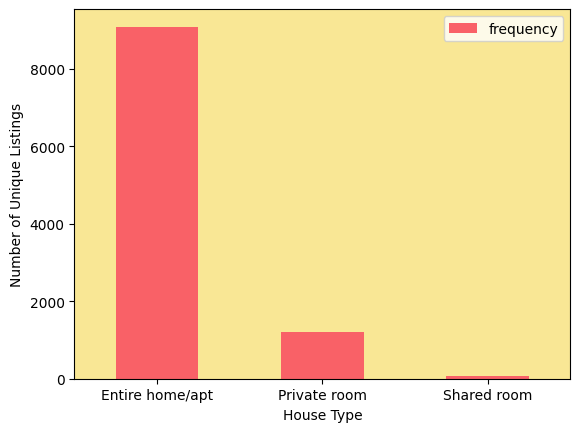

In [ ]:
roomT = train_2019[['id', 'room_type']]
roomT = roomT.drop_duplicates()

# Group by 'room_type' and count occurrences
room_type_counts = roomT.groupby('room_type').size()
counts_df = pd.DataFrame(room_type_counts, columns=['frequency'])
counts_df.reset_index(inplace=True)

ax = counts_df.plot.bar(x='room_type', y='frequency', rot=0, color='#F96167', xlabel="House Type", ylabel="Number of Unique Listings")
ax.set_facecolor('#F9E795')

#1.1 (2023)

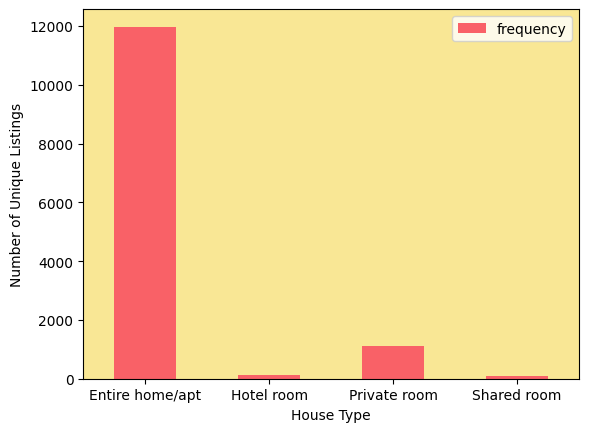

In [ ]:
roomT = train_2023[['id', 'room_type']]
roomT = roomT.drop_duplicates()

# Group by 'room_type' and count occurrences
room_type_counts = roomT.groupby('room_type').size()
counts_df = pd.DataFrame(room_type_counts, columns=['frequency'])
counts_df.reset_index(inplace=True)

ax = counts_df.plot.bar(x='room_type', y='frequency', rot=0, color='#F96167', xlabel="House Type", ylabel="Number of Unique Listings")
ax.set_facecolor('#F9E795')


#1.2 (2019)

Υπολογισμός της μέσης τιμής ανά μήνα και δημιουργία ενός dataframe με τους 3 μήνες και τις μέσες τιμές.

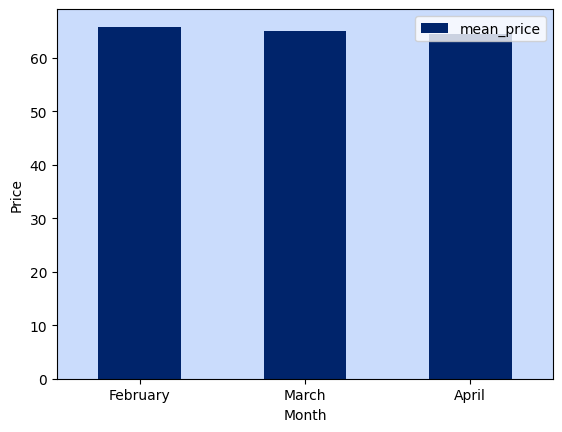

In [ ]:
prices_feb = train_2019.loc[train_2019['month'] == 'February']
prices_mar = train_2019.loc[train_2019['month'] == 'March']
prices_apr = train_2019.loc[train_2019['month'] == 'April']


lst = []
mnths = []

mnths.append('February')
lst.append(prices_feb['price'].mean())
mnths.append('March')
lst.append(prices_mar['price'].mean())
mnths.append('April')
lst.append(prices_apr['price'].mean())

dct = {'month':mnths, 'mean_price':lst} # dataframe with mean prices to plot
price_df = pd.DataFrame(dct)


ax = price_df.plot.bar(x='month', y='mean_price', rot=0, color='#00246B', xlabel="Month", ylabel="Price")
ax.set_facecolor('#CADCFC')

#1.2 (2023)

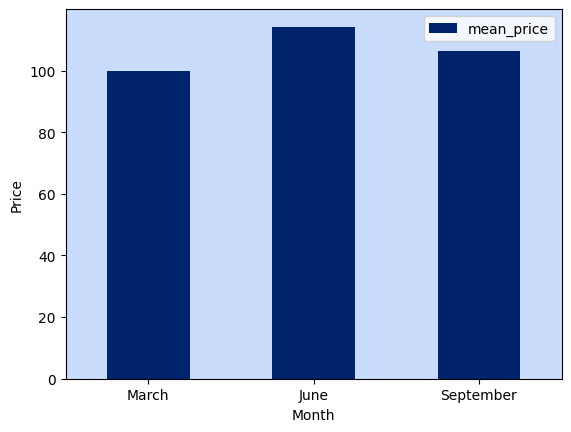

In [ ]:
prices_feb = train_2023.loc[train_2023['month'] == 'March']
prices_mar = train_2023.loc[train_2023['month'] == 'June']
prices_apr = train_2023.loc[train_2023['month'] == 'September']


lst = []
mnths = []

mnths.append('March')
lst.append(prices_feb['price'].mean())
mnths.append('June')
lst.append(prices_mar['price'].mean())
mnths.append('September')
lst.append(prices_apr['price'].mean())

dct = {'month':mnths, 'mean_price':lst}  # dataframe with mean prices to plot
price_df = pd.DataFrame(dct)


ax = price_df.plot.bar(x='month', y='mean_price', rot=0, color='#00246B', xlabel="Month", ylabel="Price")
ax.set_facecolor('#CADCFC')

#1.3 (2019)

1.3: Για να μην μεράμε περισσότερες από μία φορές τις κριτικές ενός καταλύματος, κρατάμε μόνο τον αριθμό κριτικών του τελευταίου μήνα (Απριλίου)

In [ ]:
tmp = train_2019[['id', 'month', 'number_of_reviews']].sort_values(by='number_of_reviews', ascending=False)
revs = train_2019.loc[(train_2019['month'] == 'April')]
revs = revs[['neighbourhood', 'number_of_reviews']]

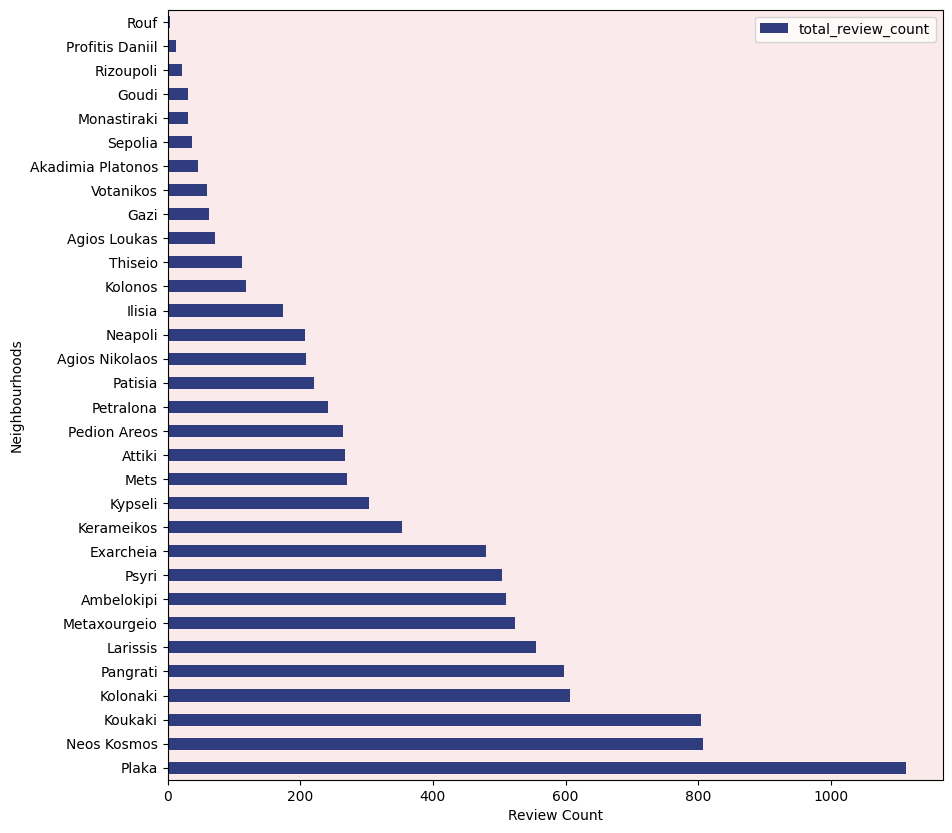

In [ ]:
# Group by 'neighbourhood' and count occurrences
most_revs = revs.groupby('neighbourhood').size()
most_revs = pd.DataFrame(most_revs, columns=['total_review_count'])
most_revs.reset_index(inplace=True)
most_revs = most_revs.sort_values(by='total_review_count',ascending=False)

ax = most_revs.plot.barh(x='neighbourhood', y='total_review_count', rot=0, color='#2F3C7E', xlabel='Review Count', ylabel='Neighbourhoods', figsize=(10,10))
ax.set_facecolor('#FBEAEB')

#1.3 (2023)

In [ ]:
tmp = train_2023[['id', 'month', 'number_of_reviews']].sort_values(by='number_of_reviews', ascending=False)
revs = train_2023.loc[(train_2023['month'] == 'September')]
revs = revs[['neighbourhood_cleansed', 'number_of_reviews']]

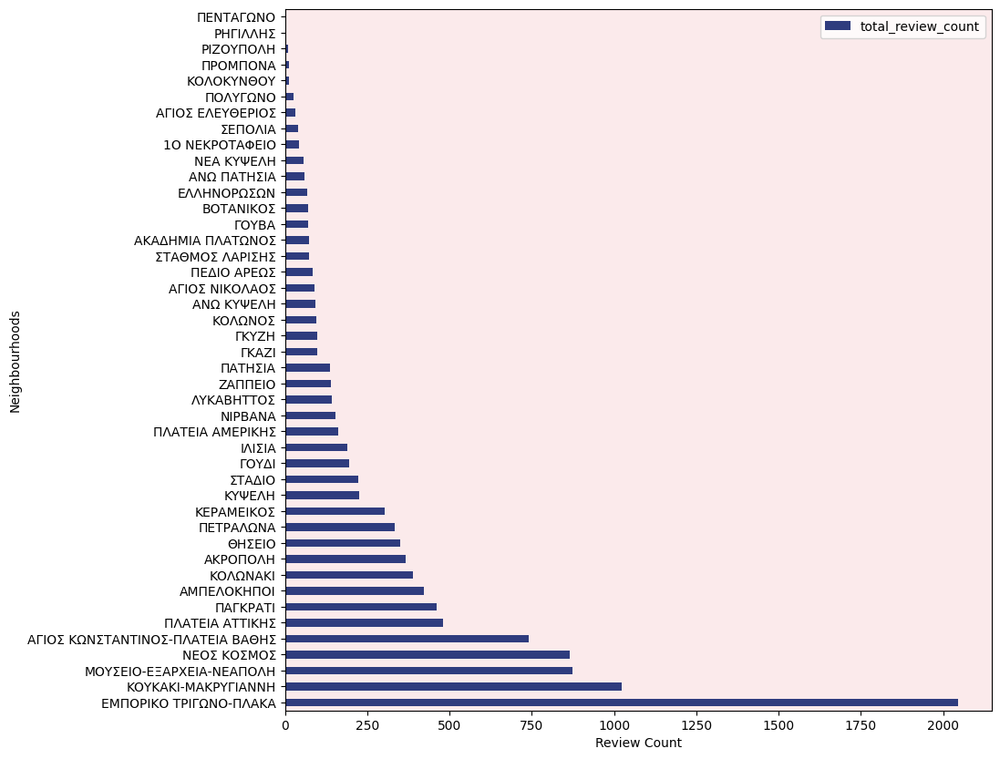

In [ ]:
# Group by 'neighbourhood_cleansed' and count occurrences
most_revs = revs.groupby('neighbourhood_cleansed').size()
most_revs = pd.DataFrame(most_revs, columns=['total_review_count'])
most_revs.reset_index(inplace=True)
most_revs = most_revs.sort_values(by='total_review_count',ascending=False)

ax = most_revs.plot.barh(x='neighbourhood_cleansed', y='total_review_count', rot=0, color='#2F3C7E', xlabel='Review Count', ylabel='Neighbourhoods', figsize=(10,10))
ax.set_facecolor('#FBEAEB')

#1.4 (2019)

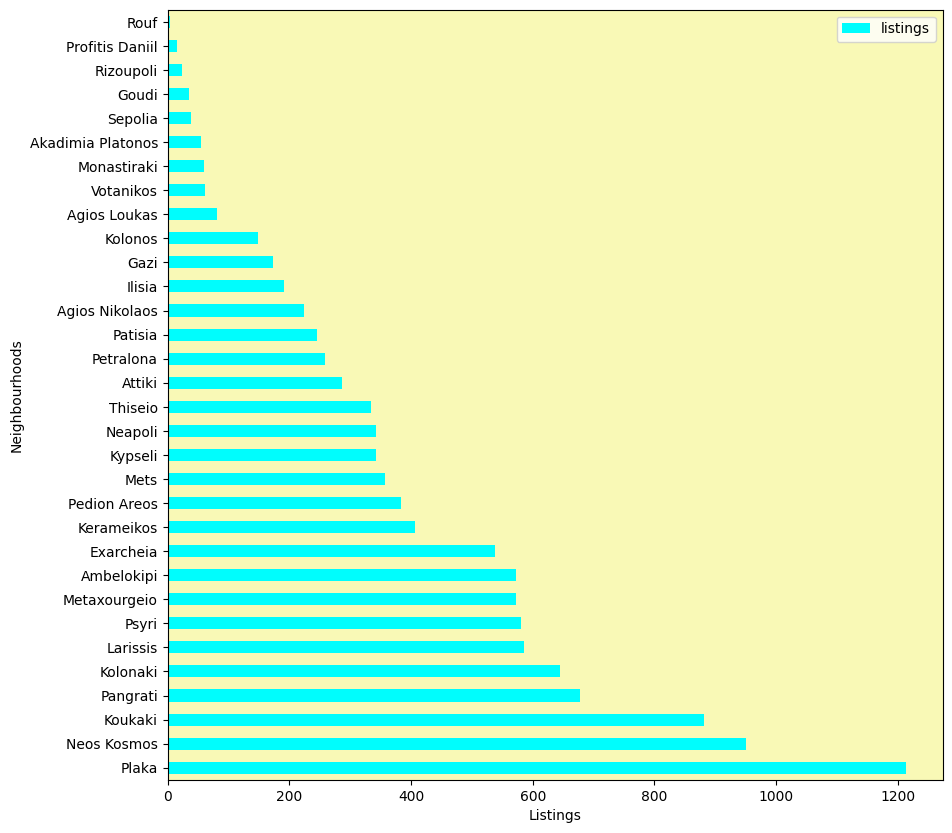

In [ ]:
listings = train_2019[['id', 'neighbourhood']]
listings = listings.drop_duplicates()

# Group by 'neighbourhood' and count occurrences
listings = listings.groupby('neighbourhood').size()
listings = pd.DataFrame(listings, columns=['listings'])
listings.reset_index(inplace=True)
listings = listings.sort_values(by='listings', ascending=False)

ax = listings.plot.barh(x='neighbourhood', y='listings', rot=0, color=['#00FDFD'], xlabel='Listings', ylabel='Neighbourhoods', figsize=(10,10))
ax.set_facecolor('#f9f9b6')

#1.4 (2023)

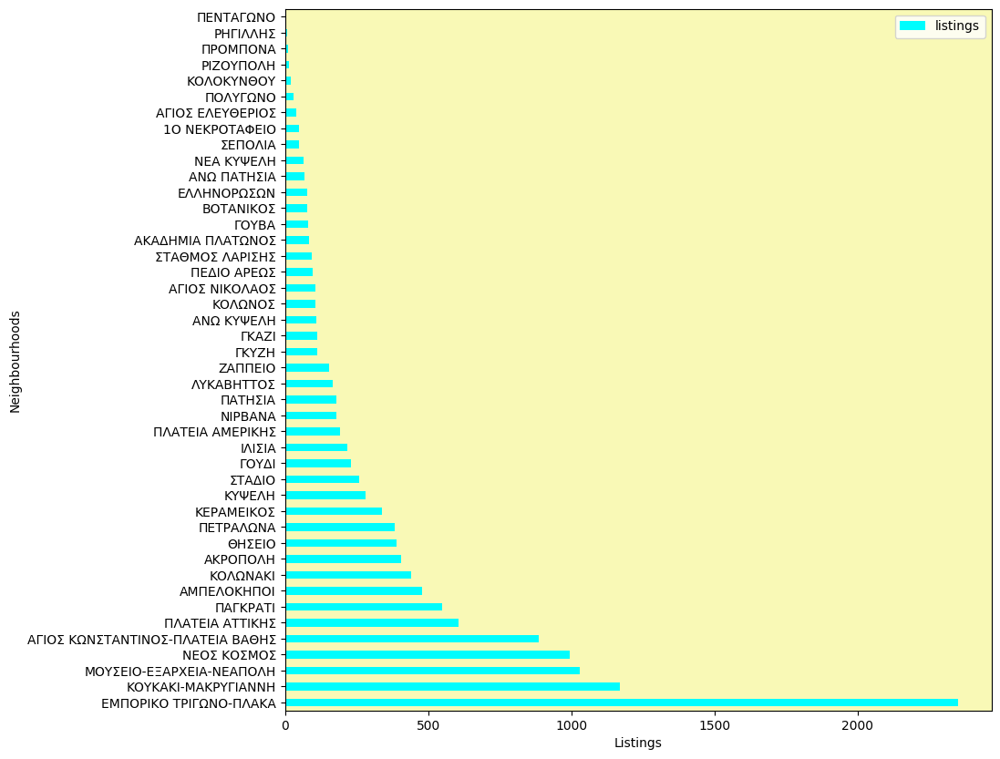

In [ ]:
listings = train_2023[['id', 'neighbourhood_cleansed']]
listings = listings.drop_duplicates()

# Group by 'neighbourhood_cleansed' and count occurrences
listings = listings.groupby('neighbourhood_cleansed').size()
listings = pd.DataFrame(listings, columns=['listings'])
listings.reset_index(inplace=True)
listings = listings.sort_values(by='listings', ascending=False)

ax = listings.plot.barh(x='neighbourhood_cleansed', y='listings', rot=0, color=['#00FDFD'], xlabel='Listings', ylabel='Neighbourhoods', figsize=(10,10))
ax.set_facecolor('#f9f9b6')

#1.5 (2019)

Δημιουργία ξεχωριστών dataframes για κάθε μήνα, για κάθε μήνα groupby με το size της κάθε γειτονιάς, δημιουργία συνολικού dataframe και plot.

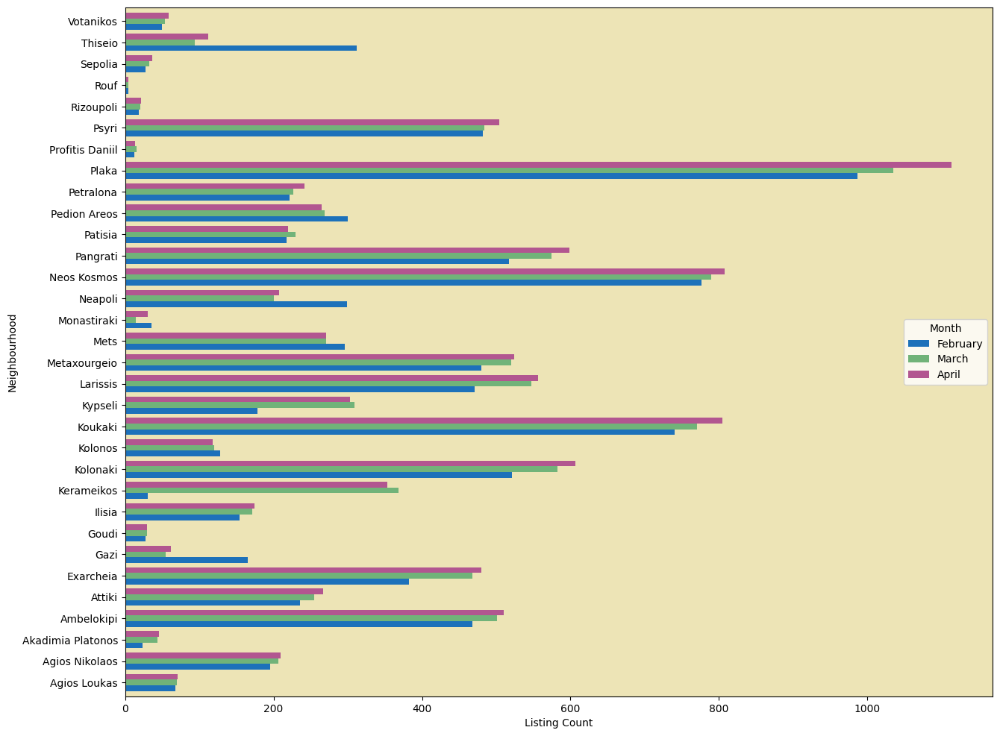

In [ ]:
listings_feb = train_2019.loc[(train_2019['month'] == 'February')]
listings_feb = listings_feb[['id', 'neighbourhood']]
listings_mar = train_2019.loc[(train_2019['month'] == 'March')]
listings_mar = listings_mar[['id', 'neighbourhood']]
listings_apr = train_2019.loc[(train_2019['month'] == 'April')]
listings_apr = listings_apr[['id', 'neighbourhood']]

# Group by 'neighbourhood' and count occurrences
listings_feb = listings_feb.groupby('neighbourhood').size()
listings_feb = pd.DataFrame(listings_feb, columns=['feb_listings'])
listings_feb.reset_index(inplace=True)

listings_mar = listings_mar.groupby('neighbourhood').size()
listings_mar = pd.DataFrame(listings_mar, columns=['mar_listings'])
listings_mar.reset_index(inplace=True)

listings_apr = listings_apr.groupby('neighbourhood').size()
listings_apr = pd.DataFrame(listings_apr, columns=['apr_listings'])
listings_apr.reset_index(inplace=True)

listings_total = listings_feb
listings_total['mar_listings'] = listings_mar['mar_listings']
listings_total['apr_listings'] = listings_apr['apr_listings']
listings_total

ax = listings_total.plot.barh(x='neighbourhood', y=['feb_listings','mar_listings', 'apr_listings'], rot=0, color=['#1D71BA', '#71B379', '#B25690'], xlabel='Listing Count', ylabel='Neighbourhood', figsize=(15,12), width=0.8)
ax.legend(['February', 'March', 'April'], loc='center right', title='Month')
ax.set_facecolor('#ede4b6')

#1.5 (2023)

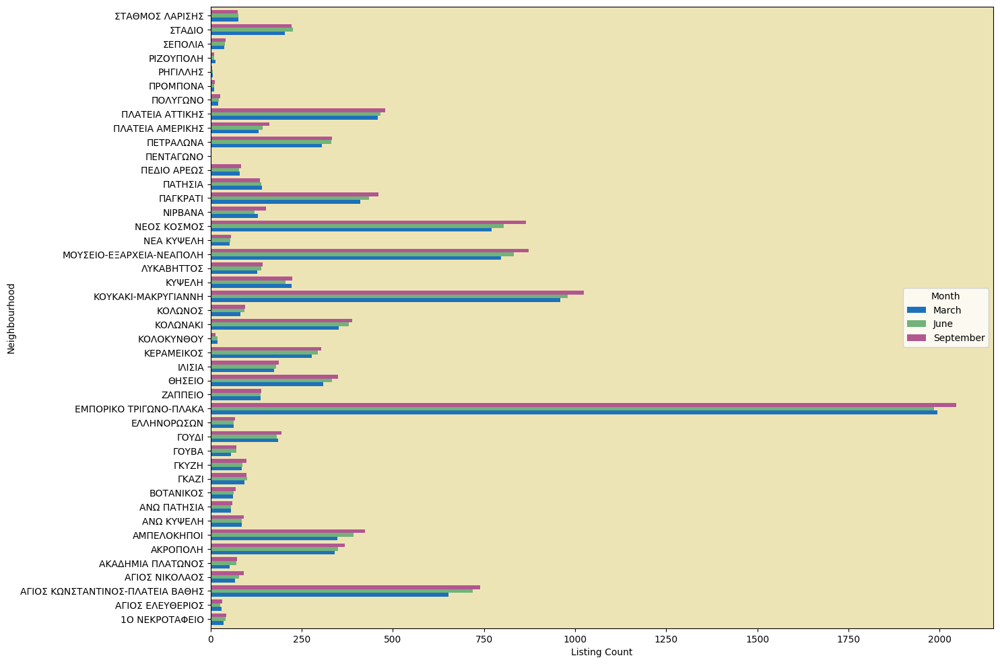

In [ ]:
listings_mar = train_2023.loc[(train_2023['month'] == 'March')]
listings_mar = listings_mar[['id', 'neighbourhood_cleansed']]
listings_jun = train_2023.loc[(train_2023['month'] == 'June')]
listings_jun = listings_jun[['id', 'neighbourhood_cleansed']]
listings_sep = train_2023.loc[(train_2023['month'] == 'September')]
listings_sep = listings_sep[['id', 'neighbourhood_cleansed']]

# Group by 'neighbourhood_cleansed' and count occurrences
listings_mar = listings_mar.groupby('neighbourhood_cleansed').size()
listings_mar = pd.DataFrame(listings_mar, columns=['mar_listings'])
listings_mar.reset_index(inplace=True)

listings_jun = listings_jun.groupby('neighbourhood_cleansed').size()
listings_jun = pd.DataFrame(listings_jun, columns=['jun_listings'])
listings_jun.reset_index(inplace=True)

listings_sep = listings_sep.groupby('neighbourhood_cleansed').size()
listings_sep = pd.DataFrame(listings_sep, columns=['sep_listings'])
listings_sep.reset_index(inplace=True)

listings_total = listings_mar
listings_total['jun_listings'] = listings_jun['jun_listings']
listings_total['sep_listings'] = listings_sep['sep_listings']
listings_total

ax = listings_total.plot.barh(x='neighbourhood_cleansed', y=['mar_listings','jun_listings', 'sep_listings'], rot=0, color=['#1D71BA', '#71B379', '#B25690'], xlabel='Listing Count', ylabel='Neighbourhood', figsize=(15,12), width=0.8)
ax.legend(['March', 'June', 'September'], loc='center right', title='Month')
ax.set_facecolor('#ede4b6')

#1.6 (ίδια με την 1.5)

#1.7 (2019)

παρόμοια με την 1.5,

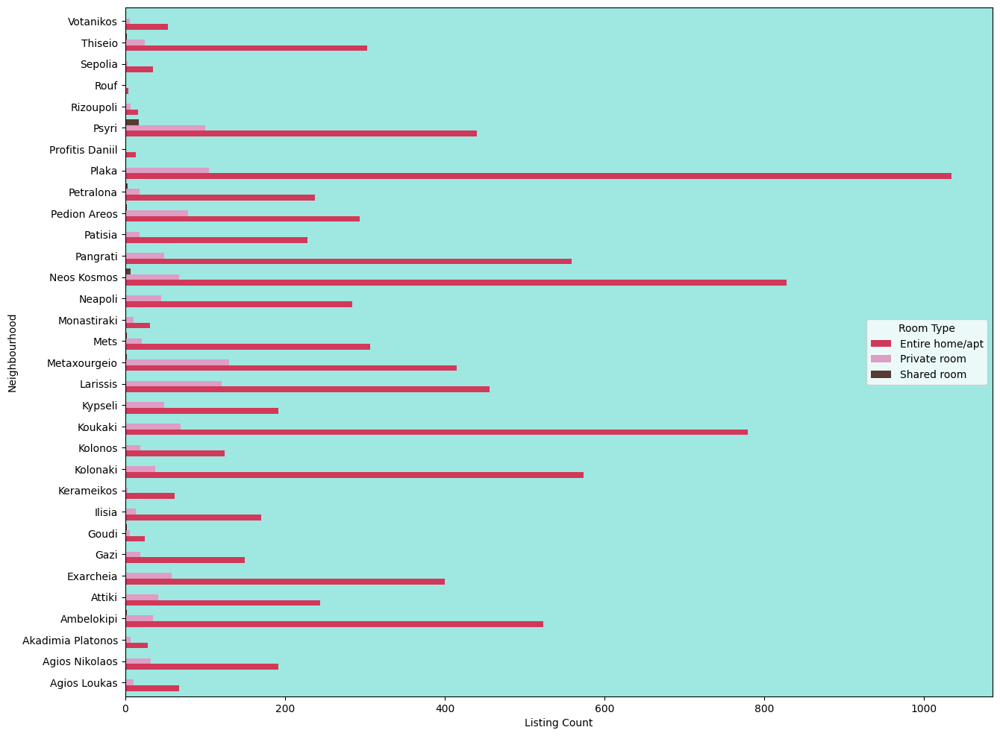

In [56]:
rTypes = train_2019[['id', 'neighbourhood', 'room_type']]
rTypes = rTypes.drop_duplicates(subset=['id'])

grouped = rTypes.groupby(['neighbourhood', 'room_type']).size().unstack(fill_value=0).stack() # Replace NaN with 0
grouped = pd.DataFrame(grouped, columns=['count'])  # create a new dataframe with the counts
grouped.reset_index(inplace=True)

grouped = grouped.pivot(index='neighbourhood', columns='room_type', values='count') # Neighbourhood becomes the index, the columns are all the room types
grouped.reset_index(inplace=True)

room_types = grouped.columns.to_list()
room_types.remove('neighbourhood') # For the y axis

ax = grouped.plot.barh(x='neighbourhood', y=room_types, rot=0, color=['#D2385A', '#DE9DC2', '#573C33'], xlabel='Listing Count', ylabel='Neighbourhood', figsize=(15,12), width=0.8)
ax.legend(['Entire home/apt', 'Private room', 'Shared room'], loc='center right', title='Room Type')
ax.set_facecolor('#9EE8E1')

#1.7 (2023)

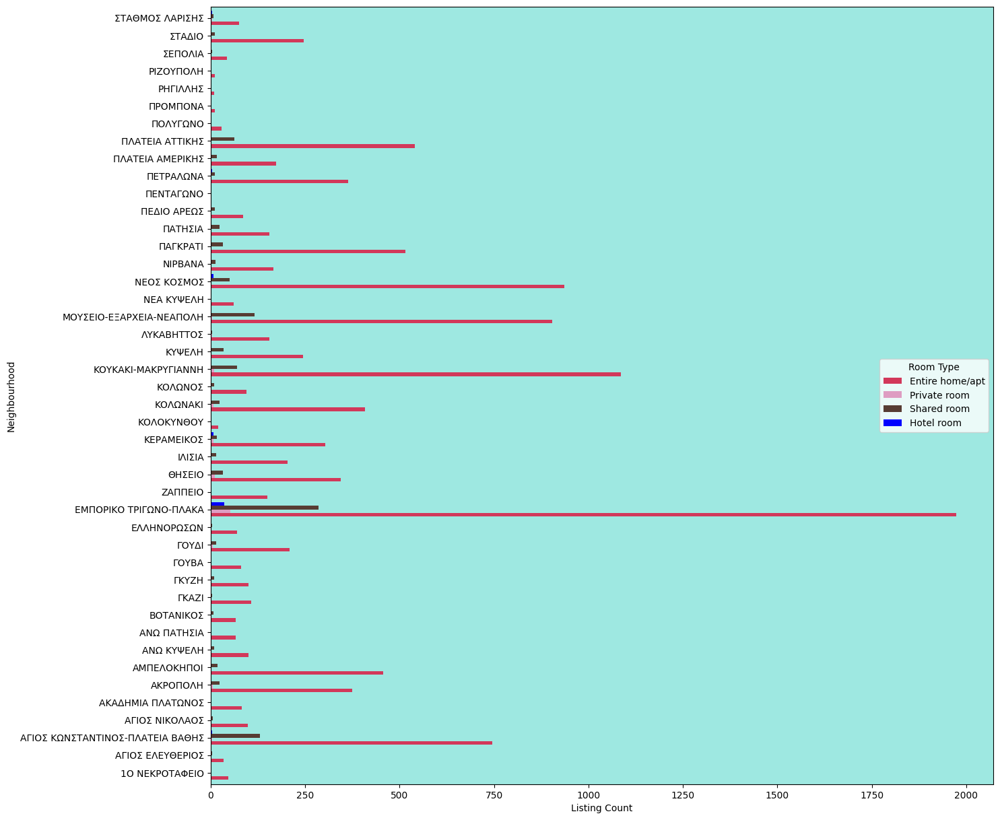

In [ ]:
rTypes = train_2023[['id', 'neighbourhood_cleansed', 'room_type']]
rTypes = rTypes.drop_duplicates(subset=['id'])

grouped = rTypes.groupby(['neighbourhood_cleansed', 'room_type']).size().unstack(fill_value=0).stack() # Replace NaN with 0
grouped = pd.DataFrame(grouped, columns=['count'])
grouped.reset_index(inplace=True)

grouped = grouped.pivot(index='neighbourhood_cleansed', columns='room_type', values='count')
grouped.reset_index(inplace=True)

room_types = grouped.columns.to_list()
room_types.remove('neighbourhood_cleansed')

ax = grouped.plot.barh(x='neighbourhood_cleansed', y=room_types, rot=0, color=['#D2385A', '#DE9DC2', '#573C33', 'b'], xlabel='Listing Count', ylabel='Neighbourhood', figsize=(15,15), width=0.8)
ax.legend(['Entire home/apt', 'Private room', 'Shared room', 'Hotel room'], loc='center right', title='Room Type')
ax.set_facecolor('#9EE8E1')

#1.8 (2019)

Δημιουργία 3 dataframes με τις μετρικές mean, max, min values ανά τύπο δωματίου και ένωσή τους σε ένα για να γίνει Plot.

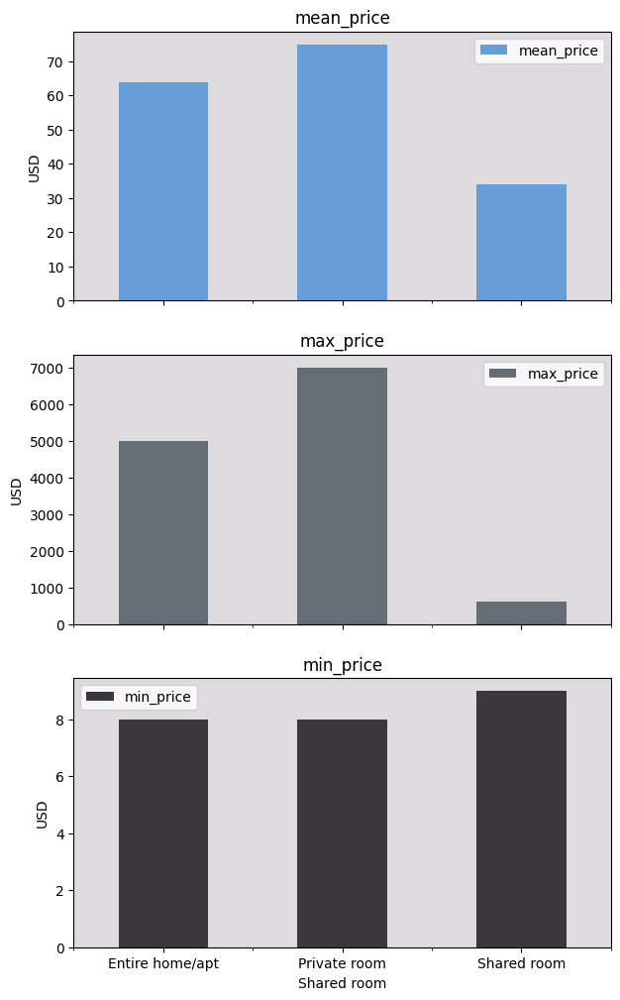

In [ ]:
rooms = train_2019[['id', 'room_type', 'price']]
rooms = rooms.drop_duplicates(subset='id')  #Do we nee subset='id' ?
rooms = rooms.drop(columns=['id']) # We dont need the id now

# 3 dataframes of the 3 metrics
mean_df = rooms.groupby('room_type').mean()
max_df = rooms.groupby('room_type').max()
min_df = rooms.groupby('room_type').min()

mean_df.reset_index(inplace=True)
max_df.reset_index(inplace=True)
min_df.reset_index(inplace=True)

# rename the columns of each df
mean_df = mean_df.rename(columns={'price': 'mean_price'})
max_df = max_df.rename(columns={'price': 'max_price'})
min_df = min_df.rename(columns={'price': 'min_price'})

# merge them to one dataframe
total_df = mean_df
total_df = total_df.merge(max_df, how='left')
total_df = total_df.merge(min_df, how='left')

# Get the room types' names
metrics = total_df.columns.to_list()
metrics.remove('room_type')

room_types = []
for typ in total_df['room_type']:
  room_types.append(typ)

ax = total_df.plot.bar(x='room_type', y=metrics, rot=0, color=['#689ed8', '#656E77', '#3B373B'], xlabel='', ylabel='USD', figsize=(7,12), subplots=True)
labels = ['mean_price', 'max_price', 'min_price']
for i, axes in enumerate(ax):
    axes.set_xlabel(room_types[i])  # Change the title of each subplot
    axes.set_facecolor('#DDDBDE')

#1.8 (2023)

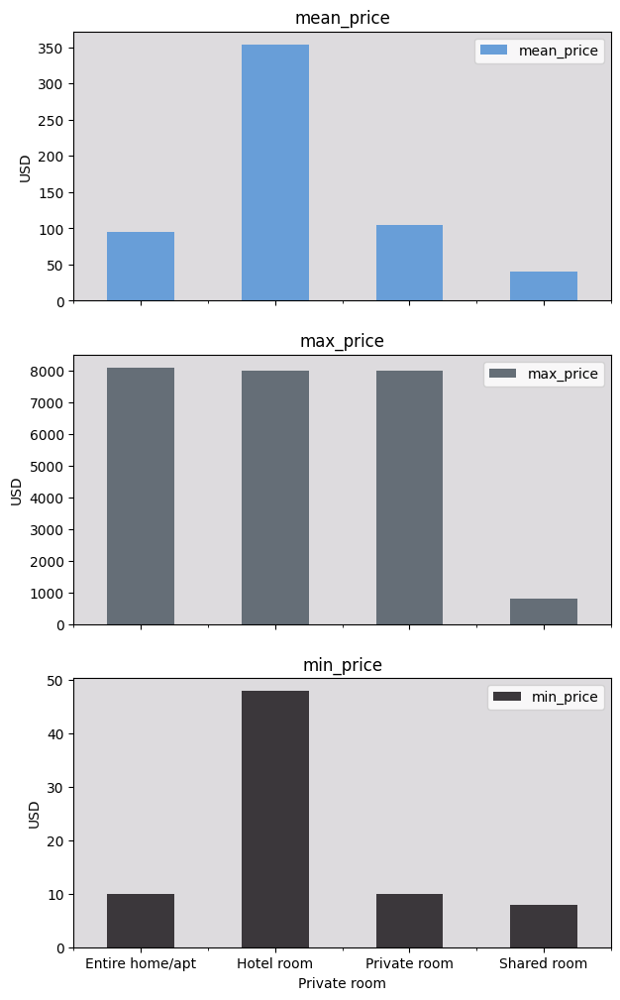

In [ ]:
rooms = train_2023[['id', 'room_type', 'price']]
rooms = rooms.drop_duplicates(subset='id')
rooms = rooms.drop(columns=['id'])

mean_df = rooms.groupby('room_type').mean()
max_df = rooms.groupby('room_type').max()
min_df = rooms.groupby('room_type').min()

mean_df.reset_index(inplace=True)
max_df.reset_index(inplace=True)
min_df.reset_index(inplace=True)

mean_df = mean_df.rename(columns={'price': 'mean_price'})
max_df = max_df.rename(columns={'price': 'max_price'})
min_df = min_df.rename(columns={'price': 'min_price'})

total_df = mean_df
total_df = total_df.merge(max_df, how='left')
total_df = total_df.merge(min_df, how='left')

metrics = total_df.columns.to_list()
metrics.remove('room_type')

room_types = []
for typ in total_df['room_type']:
  room_types.append(typ)

ax = total_df.plot.bar(x='room_type', y=metrics, rot=0, color=['#689ed8', '#656E77', '#3B373B', 'b'], xlabel='', ylabel='USD', figsize=(7,12), subplots=True)
labels = ['mean_price', 'max_price', 'min_price']
for i, axes in enumerate(ax):
    axes.set_xlabel(room_types[i])
    axes.set_facecolor('#DDDBDE')

#1.9 (για τη χρονιά 2019 μόνο)


Δημιουργία του χάρτη με τις πινέζες των καταλυμάτων. Επιλέχθηκαν τα καταλύματα του φεβρουαρίου.
Κάθε πινέζα εμφανίζει μήνυμα όταν περνάει το ποντίκι από πάνω της, και έχει επίσης έναν popup με πληροφορίες για το κατάλυμα.
Επίσης, το εσωτερικό της πινέζας είναι χρωματισμένο ανάλογα με την τιμή του καταλύματος (μπλε --> φθηνότερο, κίτρινο --> ακριβότερο)

In [ ]:
import pandas as pd
import geopandas
import folium
# import geodatasets
import matplotlib.pyplot as plt

In [ ]:
locations = train_2019[['month', 'longitude', 'latitude', 'room_type', 'property_type', 'price']]
locations = locations.loc[(locations['month'] == 'February')] # Pick one month
mean_pr = locations['price'].mean()

65.79596839476262

In [ ]:
import matplotlib
cmap = matplotlib.cm.get_cmap('cividis')

marks = locations.sample(5000)  # take some of the locations (cant handle all the markers)

tooltip = "Click for more details"  # When hovering over marker
map_osm = folium.Map(location = [37.983810, 23.727539], zoom_start = 12, tiles="cartodb positron")  # The map is initialized in Athens and is zoomed in
for index, row in marks.iterrows():
  rgba = cmap(row['price']/mean_pr) # Take the color thet corresponds to the price of the listing
  html_color = "#{:02x}{:02x}{:02x}".format(int(rgba[0] * 255), int(rgba[1] * 255), int(rgba[2] * 255)) # Convert to html color

  # create marker with a pop up as well
  folium.Marker(location=[row["latitude"], row["longitude"]], icon=folium.Icon(color='lightblue', icon="info-sign", icon_color=html_color), popup='room type = {}, property type = {}, price = {}$'.format(row["room_type"], row["property_type"], row["price"]), tooltip=tooltip).add_to(map_osm)

map_osm

<ipython-input-177-e66a469198a6>:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = matplotlib.cm.get_cmap('cividis')


#1.10 (2019)


Η συνάρτηση WordCloud δέχεται string ως είσοδο, αλλά οι στήλες κειμένου έχουν γίνει tokenized κατά το καθάρισμα. Γι' αυτό δημιουργείται πρώτα ένα μεγάλο string με το concatenation των λέξεων όλων των λιστών.

In [ ]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

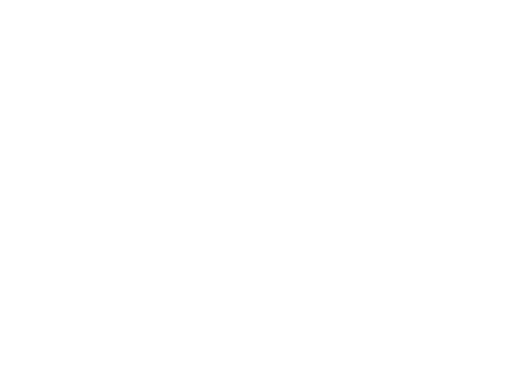

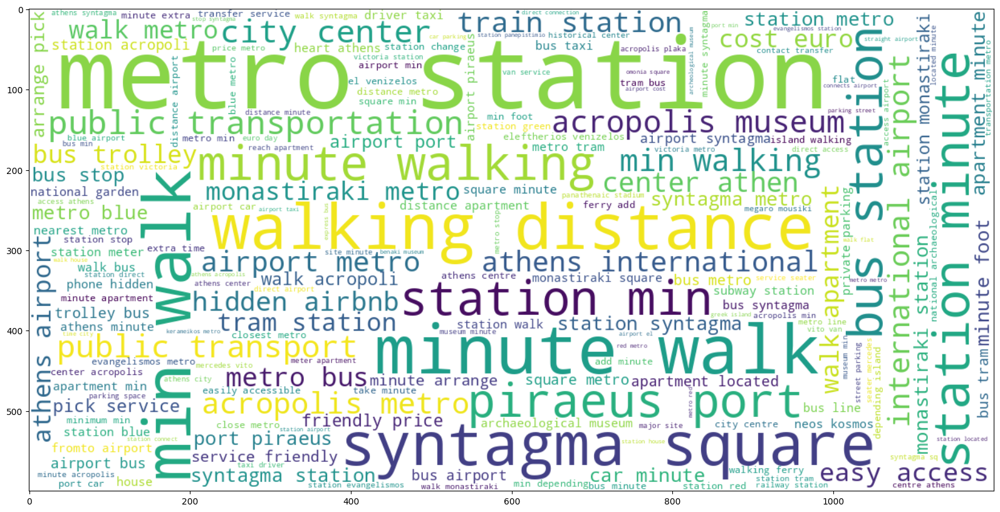

In [ ]:
text = '' #Create a big strng of all the words in 'transit' to be processed from wordcloud
for index, row in train_2019[['id', 'transit']].iterrows():
  text += " ".join(row['transit'])
  text += ' '

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

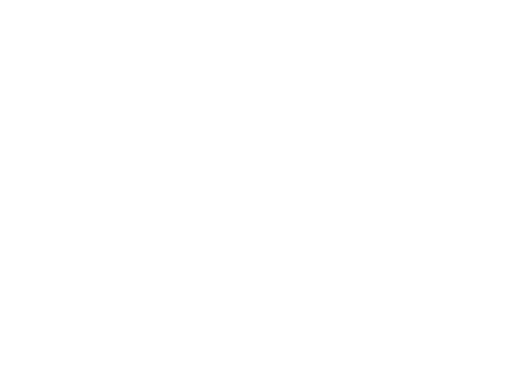

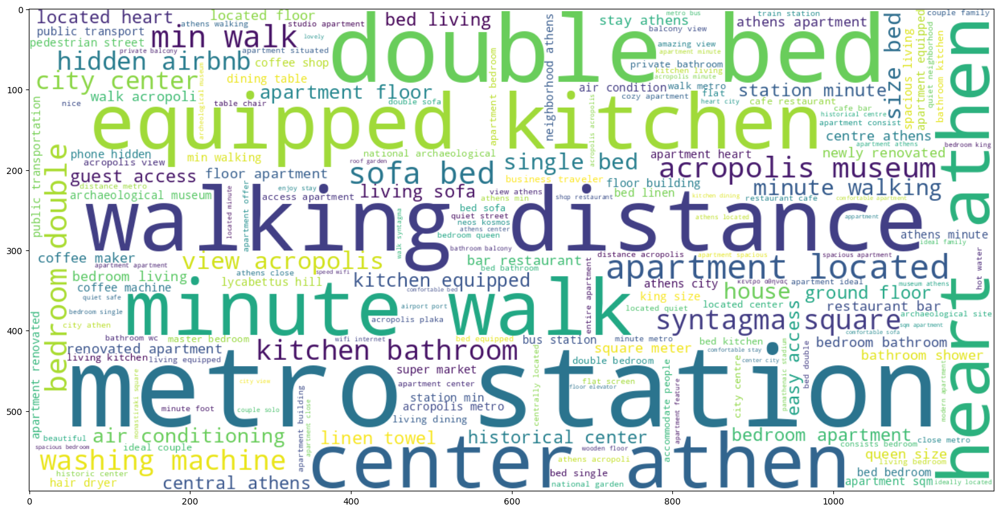

In [ ]:
text = ''
for index, row in train_2019[['id', 'description']].iterrows():
  text += " ".join(row['description'])
  text += ' '

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

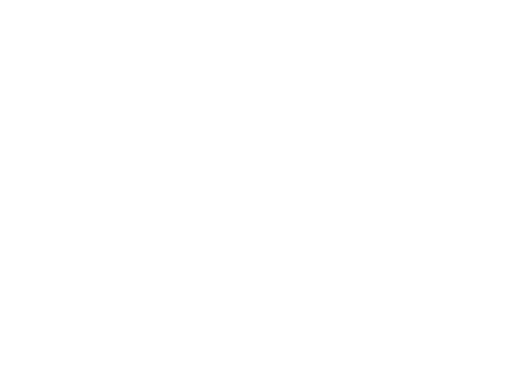

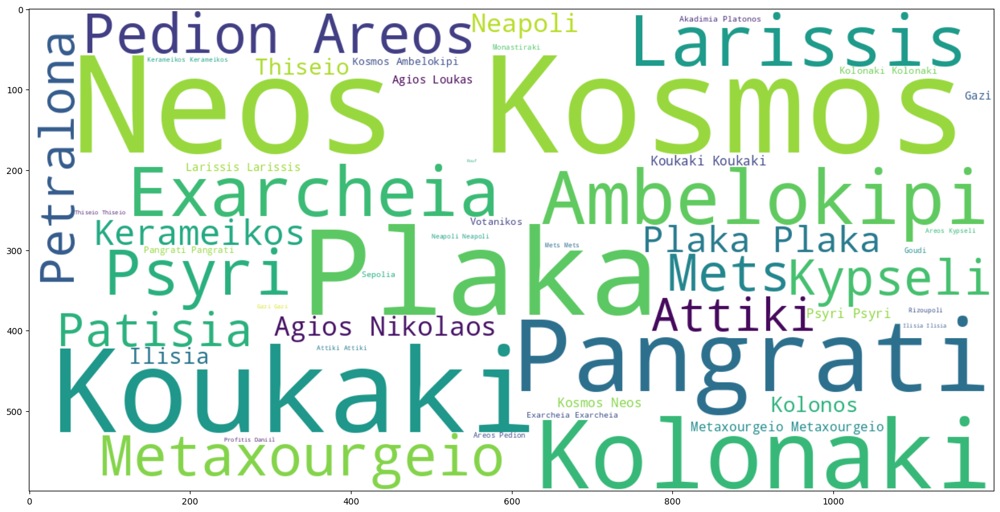

In [ ]:
text = " ".join(hood for hood in train_2019['neighbourhood'])

# text
wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

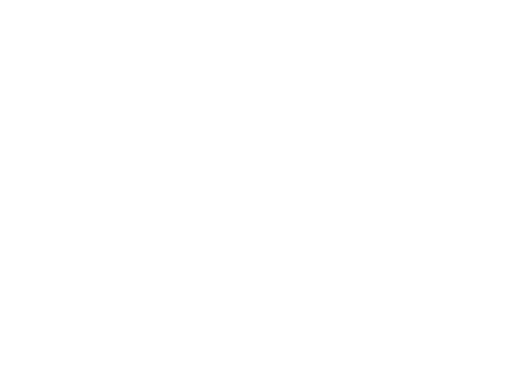

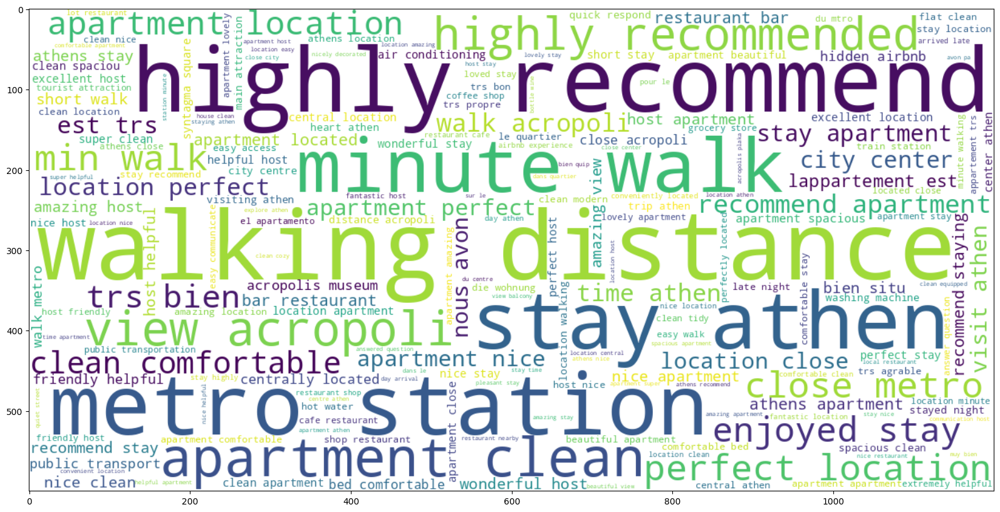

In [ ]:
#(24 + ? minutes)
text = ''
for index, row in comm_2019.iterrows():
  text += " ".join(row['comments'])
  text += ' '

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

#1.10 (2023)

In [ ]:
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

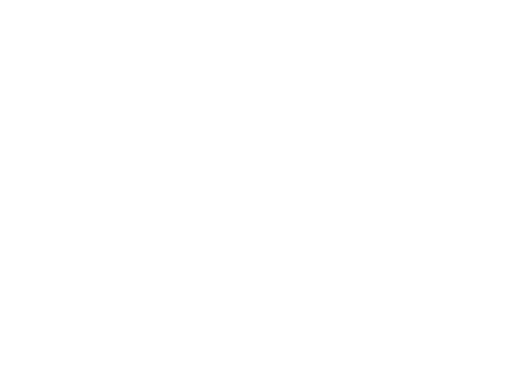

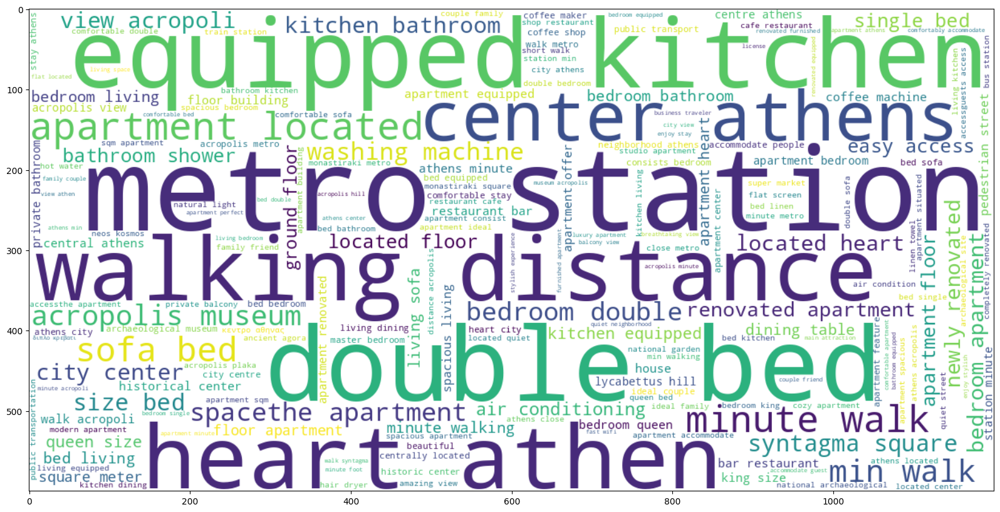

In [ ]:
text = ''
for index, row in train_2023[['id', 'description']].iterrows():
  text += " ".join(row['description'])
  text += ' '

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

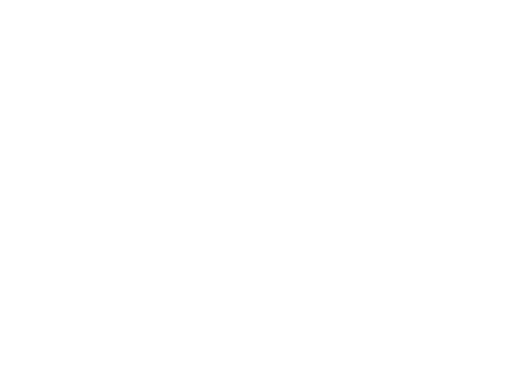

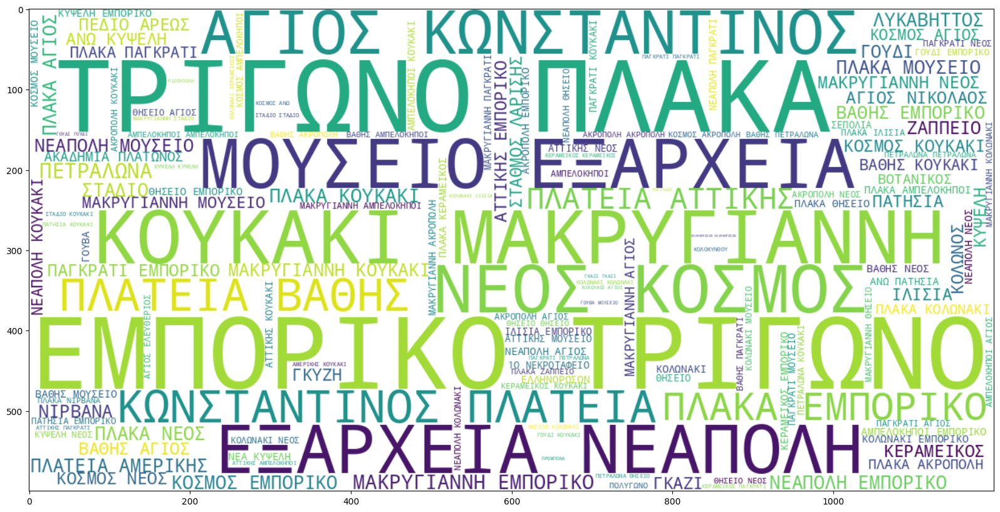

In [ ]:
text = " ".join(review for review in train_2023['neighbourhood_cleansed'])

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

Τα comments του 2023 είναι πάρα πολλά και η δημιουργία τους wordcloud είναι πολύ χρονοβόρα αν επιλεχθούν όλα τα δεδομένα. Γίνεται τυχαία επιλογή του 50% των comments.

In [ ]:
half = round(comm_2023.shape[0] / 2)
sample_comm_2023 = comm_2023.sample(half)

sample_comm_2023
# Sample 50% of the data randomly (couldnt handle them all)

,comments
5659,"[cool, modern, apartment, perfect, view, aris,..."
1230818,"[bel, appartement, propre, terrasse, trs, symp..."
485008,"[host, super, helpful, advertised, definite]"
368010,"[excellent, stay, apartment, clean, location, ..."
1105210,"[lokalizacja, niebezpieczna, zwaszcza, dla, mo..."
...,...
293565,"[beautiful, view, acropolis, nice, time, apt, ..."
1695528,[]
846793,[sokol]
623296,"[todo, perfecto, el, piso, pequeo, pero, adecu..."


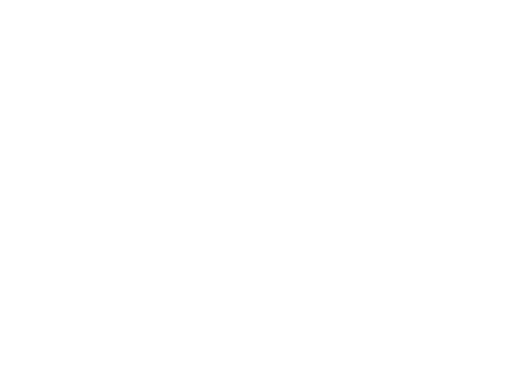

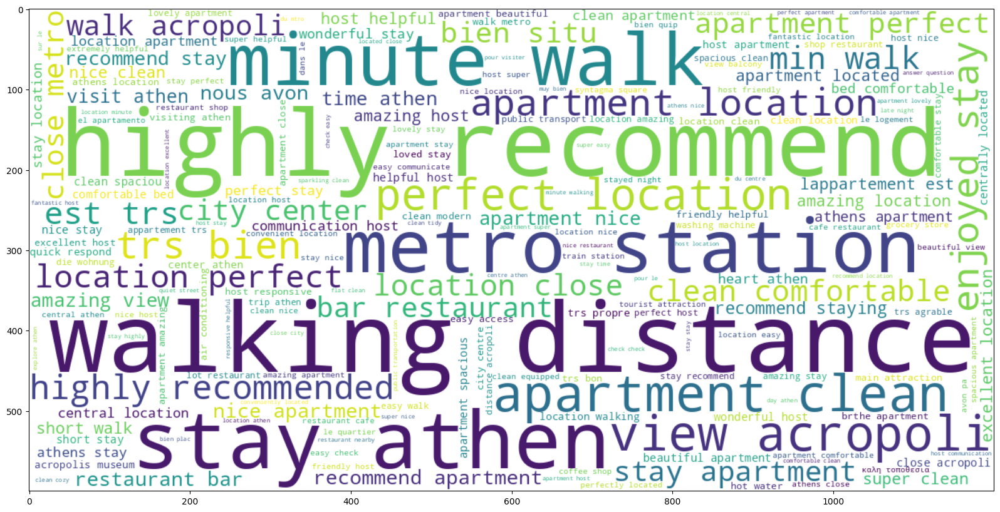

In [ ]:
text = ''
for index, row in sample_comm_2023.iterrows():
  text += " ".join(row['comments'])
  text += ' '

wordcloud = WordCloud(background_color="white", width=1200, height=600).generate(text)

plt.axis("off")
plt.figure( figsize=(20,10))
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()

(δεν υπάρχει στήλη transit στα δεδομένα του 2023)

#1.11 (2019)

Δημιουργία των κατηγοριών που εμφανίζονται παρακάτω, και ένταξη κάθε πιθανού amenitiy σε μια από αυτές.
'Επειτα, αντικατάστηαση του κάθε amenity με το όνομα της κατηγορίας στην οποία ανήκει. Μετατροπή σε set ώστε κάθε κατηγορία να υπάρχει το πολύ μια φορά σε κάθε row. Τελικά, δημιουργία μιας μεγάλης λίστας με όλα τα amenities όλων των γραμμών του dataframe, και υπολογισμός των συχνοτήτων τους για τη διμιουργία του Plot.

In [ ]:
kitchen = ['Kitchen', 'Microwave', 'Coffee maker', 'Refrigerator', 'Dishwasher', 'Dishes and silverware', 'Cooking basics', 'Oven', 'Stove', 'Full kitchen', 'BBQ grill', 'Convection oven', 'Mini fridge', 'Breakfast table', 'Espresso machine', 'Formal dining area', 'Double oven', 'Kitchenette', 'Steam oven', 'Gas oven', 'Wine cooler', 'Freezer']
accesibility = ['Accesibility', 'Elevator', 'Wide doorway', 'Step-free access', 'Wide clearance to bed', 'Accessible-height bed', 'Wide hallway clearance', 'Flat path to front door', 'Wide entryway', 'Well-lit path to entrance', 'Accessible-height toilet', 'Wide clearance to shower, toilet', 'Wheelchair accessible', 'Stair gates', 'Fixed grab bars for shower', 'Disabled parking spot', 'Fixed grab bars for toilet', 'Ground floor access', 'Lake access']
electricity_technology = ['electricity_technology', 'TV', 'Cable TV', 'Internet', 'Wifi', 'Air conditioning', 'Buzzer/wireless intercom', 'Heating', 'Washer', 'Dryer', 'Hair dryer', 'Iron',  'Ethernet connection', 'Pocket wifi', 'Washer / Dryer', 'DVD player', 'EV charger', 'Keypad', 'Smart TV', 'Sound system', 'High-resolution computer monitor', 'Printer', 'Netflix', 'Fax machine', 'Central air conditioning', 'Ceiling fan', 'Projector and screen', 'Amazon Echo', 'Heat lamps', 'HBO GO', 'Electric profiling bed']
facilities = ['Facilities', 'Patio or balcony', 'Bathtub', 'Indoor fireplace', 'Private living room', 'Single level home' ,'Hot tub', 'Garden or backyard', 'Fire pit', 'Walk-in shower', 'Terrace', 'Balcony', 'Outdoor seating', 'Bathtub with bath chair', 'Roll-in shower', 'Shower chair', 'Gym', 'Soaking tub', 'En suite bathroom', 'Pool', 'Ski', 'Bidet', 'Heated towel rack', 'Day bed', 'Outdoor parking', 'Standing valet', 'Waterfront', 'Heated floors', 'Stand alone steam shower', 'Jetted tub', 'Alfresco bathtub', 'Private bathroom', 'Sun loungers', 'Private pool', 'Sauna', 'Private hot tub']
kids_friendly = ['Family/kid friendly', 'High chair', 'Pack ’n Play/travel crib', 'Children’s books and toys', 'Crib', 'Game console', 'Children’s dinnerware', 'Baby monitor', 'Changing table', 'Outlet covers', 'Baby bath', 'Babysitter recommendations', 'Table corner guards', 'Fireplace guards']
security = ['Security', 'Safety card', 'Fire extinguisher', 'Smoke detector', 'Carbon monoxide detector', 'Lock on bedroom door', 'Lockbox', 'Doorman', 'Private entrance', 'Window guards', 'Smart lock']
services = ['Services', '24-hour check-in', 'Laptop friendly workspace', 'Hot water', 'Luggage dropoff allowed', 'Host greets you', 'Long term stays allowed', 'Paid parking off premises', 'Room-darkening shades', 'Breakfast', 'Free street parking', 'Self check-in', 'Smoking allowed', 'Free parking on premises', 'Paid parking on premises', 'Firm mattress', 'Hot water kettle', 'Air purifier', 'Warming drawer']
medical = ['Medical', 'First aid kit']
essentials = ['Essentials', 'Shampoo', 'Essentials', 'Hangers', 'Bed linens', 'Extra pillows and blankets', 'Body soap', 'Bath towel', 'Toilet paper', 'Bedroom comforts', 'Bathroom essentials', 'Beach essentials', 'Exercise equipment', 'Pillow-top mattress', 'Ironing Board']
obligations = ['Obligations', 'Cleaning before checkout']
other = ['Other', 'Handheld shower head', 'translation missing: en.hosting_amenity_49', 'translation missing: en.hosting_amenity_50', 'Building staff', 's', 'Suitable for events', 'Rain shower', 'Memory foam mattress', 'Murphy bed', 'Mountain view', 'in', 'out', 'Mudroom', 'Beachfront', 'Touchless faucets', 'Beach view', 'Hammock']
pets = ['Pets', 'Pets allowed', 'Pets live on this property', 'Dog', 'Cat', 'Other pet(s)']

allLists = [kitchen, accesibility, electricity_technology, facilities, kids_friendly, security, services, medical, essentials, obligations, other, pets]


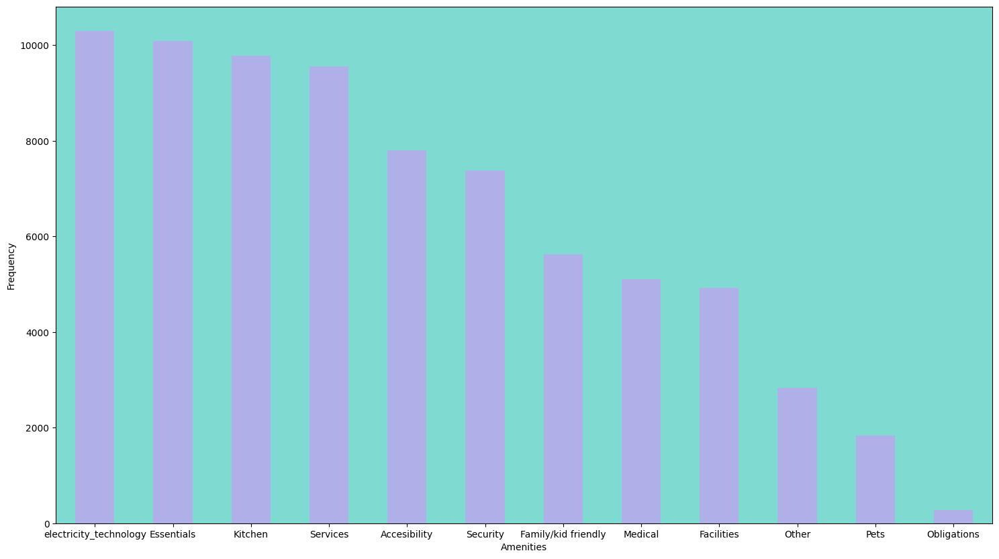

In [ ]:
amen = train_2019[['id', 'amenities']]
amen = amen.drop_duplicates(subset='id')

pd.options.mode.chained_assignment = None

amenities_new = amen.copy()
amenities_new['amenities'] = np.nan_to_num

for row in amen.iterrows():
  newL = []   # A list with all the unique categories of each row
  for item in row[1][1]:
    for itemList in allLists: # Check in which category the item belongs
      if item in itemList:
        newL.append(itemList[0])  # And add the name of the catrgory instead
        break
  newL = list(set(newL))  # Remove duplicates

  amenities_new = amenities_new.copy()
  amenities_new['amenities'].loc[row[0]] = newL # Assign the new list to the column 'amenities'

amenities_flat = [amenity for itm in amenities_new['amenities'] for amenity in itm] # Create a big list of all the amenities
amenity_counts = pd.Series(amenities_flat).value_counts() # Count their frequency for the graph

ax = amenity_counts.plot.bar(rot=0, color=['#b0b0e8'], xlabel='Amenities', ylabel='Frequency', figsize=(18,10))
ax.set_facecolor('#7fdbd2')

#1.12 (2019)

φτηνές θεωρήθηκαν οι περιοχές με μ.ο τιμών 0-50$, μέτριες οι 50-100$, και ακριβές οι 100$+
Ομαδοποίηση και χρωματισμός κάθε μπάρας ανάλογα την τιμή

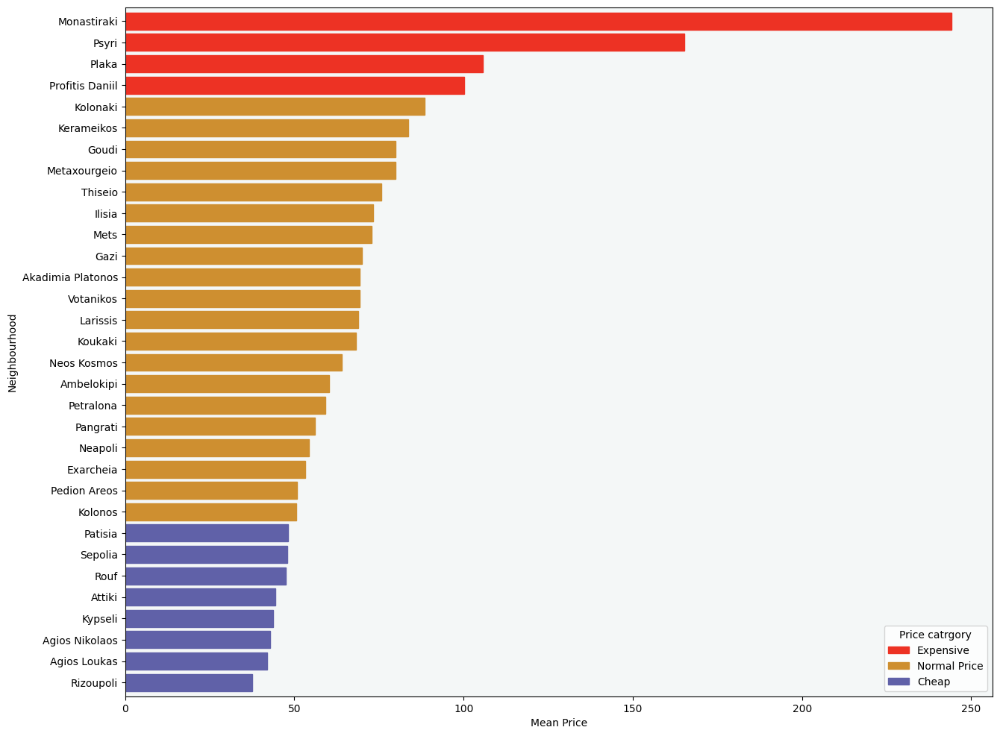

In [ ]:
prices = train_2019[['id', 'neighbourhood', 'price', 'bedrooms']]
prices = prices.loc[(prices['bedrooms'] == 2)]  # Rooms for 2 people
prices = prices.drop_duplicates(subset='id')

prices = prices.reset_index(drop=True)
prices = prices.drop(['id', 'bedrooms'], axis=1)  # these columns are needless

grouped = prices.groupby('neighbourhood').mean()
grouped = grouped.reset_index()

grouped = grouped.sort_values(by='price', ascending=True)

# fthina: 0-50, metria:50-100, akriva: 100+

ax = grouped.plot.barh(x='neighbourhood', y='price', rot=0, color=['#003f5c'], xlabel='Mean Price', ylabel='Neighbourhood', figsize=(15,12), width=0.8)
ax.set_facecolor('#F4F7F7')

for row,bar in zip(grouped.iterrows(), ax.patches):
  if (row[1][1] <= 50):
    bar.set_color('#6061A8')
  elif (row[1][1] > 50 and row[1][1] < 100):
    bar.set_color('#CE8F30')
  else:
    bar.set_color('#ED3224')

# Create custom legend
import matplotlib.patches as mpatches
akriva = mpatches.Patch(color='#6061A8', label='Cheap')
metria = mpatches.Patch(color='#CE8F30', label='Normal Price')
ftina = mpatches.Patch(color='#ED3224', label='Expensive')
plt.legend(handles=[ftina, metria, akriva], title='Price catrgory')

#1.12 (2023)

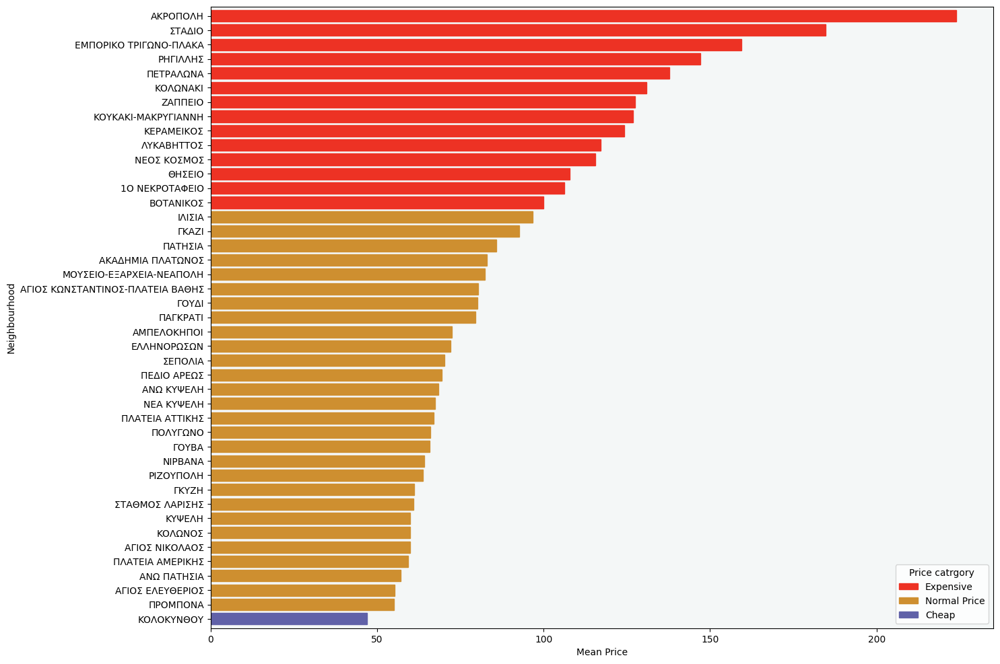

In [ ]:
prices = train_2023[['id', 'neighbourhood_cleansed', 'price', 'bedrooms']]
prices = prices.loc[(prices['bedrooms'] == 2)]
prices = prices.drop_duplicates(subset='id')

prices = prices.reset_index(drop=True)
prices = prices.drop(['id', 'bedrooms'], axis=1)

grouped = prices.groupby('neighbourhood_cleansed').mean()
grouped = grouped.reset_index()

grouped = grouped.sort_values(by='price', ascending=True)

# fthina: 0-50, metria:50-80, akriva: 100+

ax = grouped.plot.barh(x='neighbourhood_cleansed', y='price', rot=0, color=['#003f5c'], xlabel='Mean Price', ylabel='Neighbourhood', figsize=(15,12), width=0.8)
ax.set_facecolor('#F4F7F7')

for row,bar in zip(grouped.iterrows(), ax.patches):
  if (row[1][1] <= 50):
    bar.set_color('#6061A8')
  elif (row[1][1] > 50 and row[1][1] < 100):
    bar.set_color('#CE8F30')
  else:
    bar.set_color('#ED3224')

# Create custom legend
import matplotlib.patches as mpatches
akriva = mpatches.Patch(color='#6061A8', label='Cheap')
metria = mpatches.Patch(color='#CE8F30', label='Normal Price')
ftina = mpatches.Patch(color='#ED3224', label='Expensive')
plt.legend(handles=[ftina, metria, akriva], title='Price catrgory')

#1.13, ερωτήματα (2019 και 2023):

α).Ποια η σχέση της τιμής - αριθμού δωματίων και μπάνιων; (Στο ίδιο διάγραμμα)

<Axes: xlabel='price'>

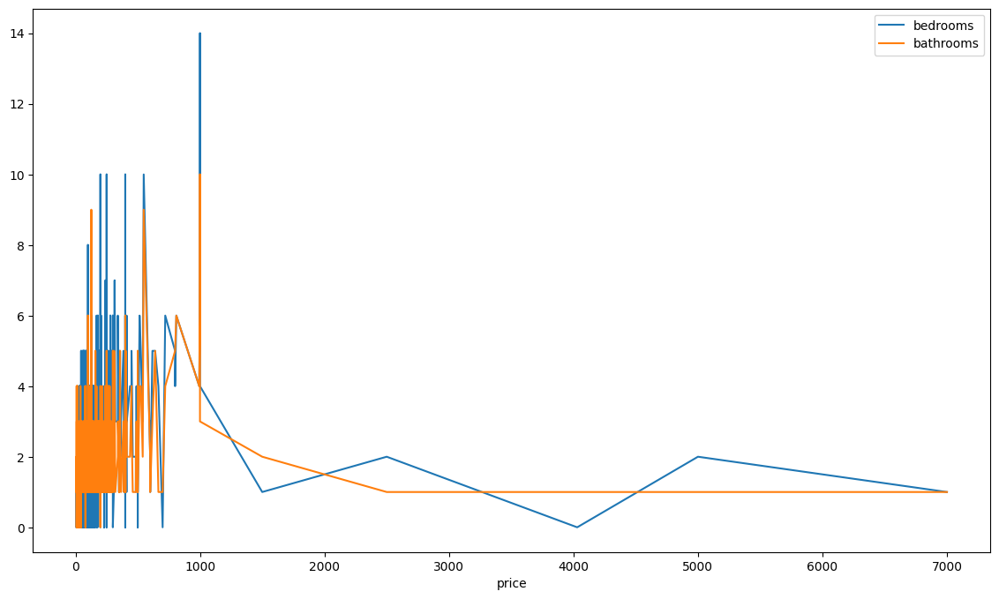

In [ ]:
room_info = train_2019[['id', 'bedrooms', 'bathrooms', 'price']]
room_info = room_info.drop_duplicates(subset='id')

room_info = room_info.reset_index(drop=True)
room_info = room_info.drop('id', axis=1)
room_info = room_info.sort_values(by='price')

room_info.plot(x='price', y=['bedrooms','bathrooms'], kind='line', figsize=(14,8))

<Axes: xlabel='price'>

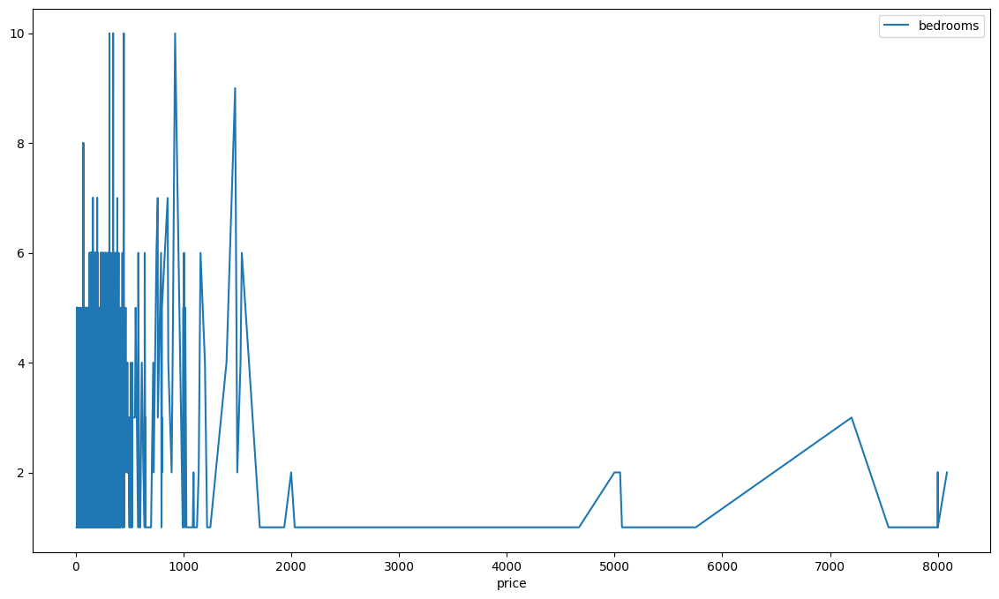

In [ ]:
#2023 doesnt have bathrooms

room_info = train_2023[['id', 'bedrooms', 'price']]
room_info = room_info.drop_duplicates(subset='id')

room_info = room_info.reset_index(drop=True)
room_info = room_info.drop('id', axis=1)
room_info = room_info.sort_values(by='price')

room_info.plot(x='price', y=['bedrooms'], kind='line', figsize=(14,8))

β).Ποιο είναι το πιο κοινό cancellation_policy;

Δημιουργία γραφήματος πίτας.
Οι κατηγορίες είναι πολλές, οπότε αν μια κατηγορία αποτελεί \<0.5% του συνόλου, την εντάσσουμε στην κατηγορία 'others'

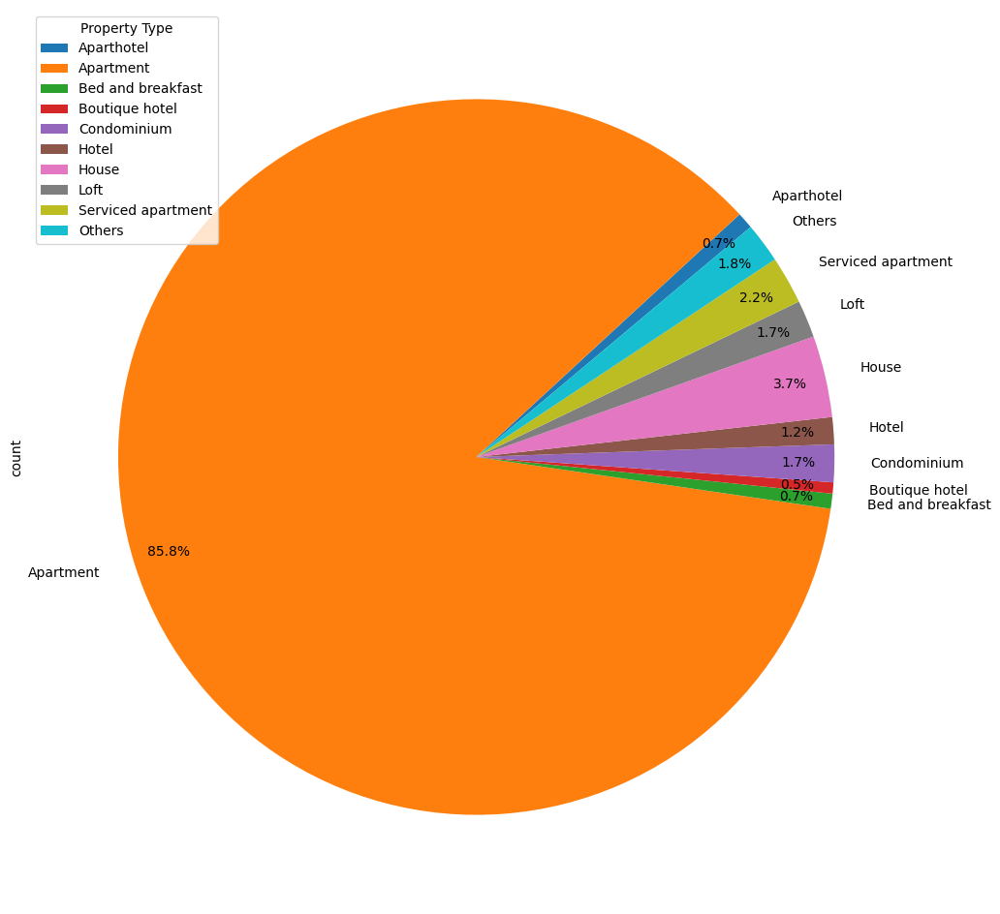

In [59]:
prop_types = train_2019[['id', 'property_type']]
prop_types = prop_types.drop_duplicates(subset='id')
prop_types = prop_types.groupby(by='property_type').size()

prop_types = pd.DataFrame(prop_types, columns=['count'])
prop_types.reset_index(inplace=True)

sum = prop_types['count'].sum() # get the total number of properties

prop_types1 = prop_types

other_count = 0
for row in prop_types.iterrows():
  if (row[1][1]/sum) < 0.005: # 0.5%
    other_count += row[1][1]
    prop_types1 = prop_types1.loc[(prop_types1['property_type'] != row[1][0])]

prop_types1.loc[len(prop_types1.index)] = ['Others', other_count]
prop_types1 = prop_types1.set_index('property_type')

pie = prop_types1.plot.pie(y='count', figsize=(12, 12), startangle=40, autopct='%1.1f%%',  pctdistance=0.90)
pie.legend(loc='upper left', title='Property Type')

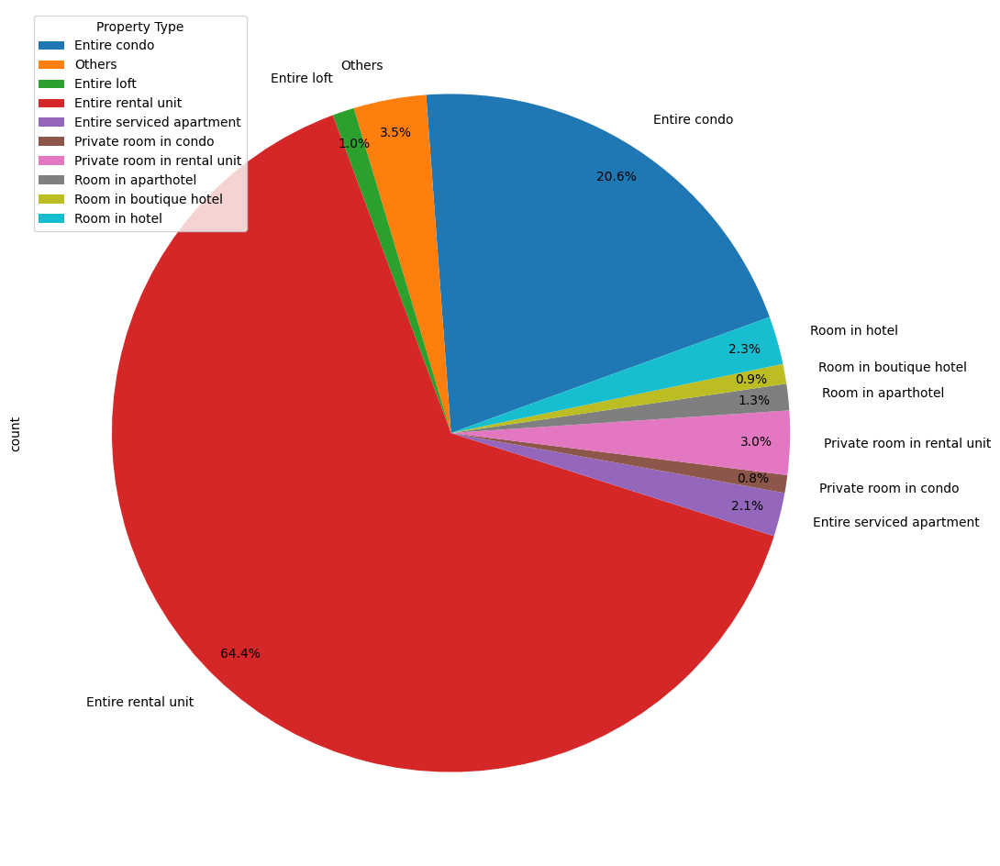

In [ ]:
prop_types = train_2023[['id', 'property_type']]
prop_types = prop_types.drop_duplicates(subset='id')
prop_types = prop_types.groupby(by='property_type').size()

prop_types = pd.DataFrame(prop_types, columns=['count'])
prop_types.reset_index(inplace=True)

sum = prop_types['count'].sum()

prop_types1 = prop_types

other_count = 0
for row in prop_types.iterrows():
  if (row[1][1]/sum) < 0.005: # 0.5%
    other_count += row[1][1]
    prop_types1 = prop_types1.loc[(prop_types1['property_type'] != row[1][0])]

prop_types1.loc[len(prop_types1.index)] = ['Others', other_count]
prop_types1 = prop_types1.set_index('property_type')

pie = prop_types1.plot.pie(y='count', figsize=(12, 12), startangle=20, autopct='%1.1f%%',  pctdistance=0.90)
pie.legend(loc='upper left', title='Property Type')

γ).Ποια η σχέση του Μ.Ο των κριτικών και της τιμής ενός καταλύματος;

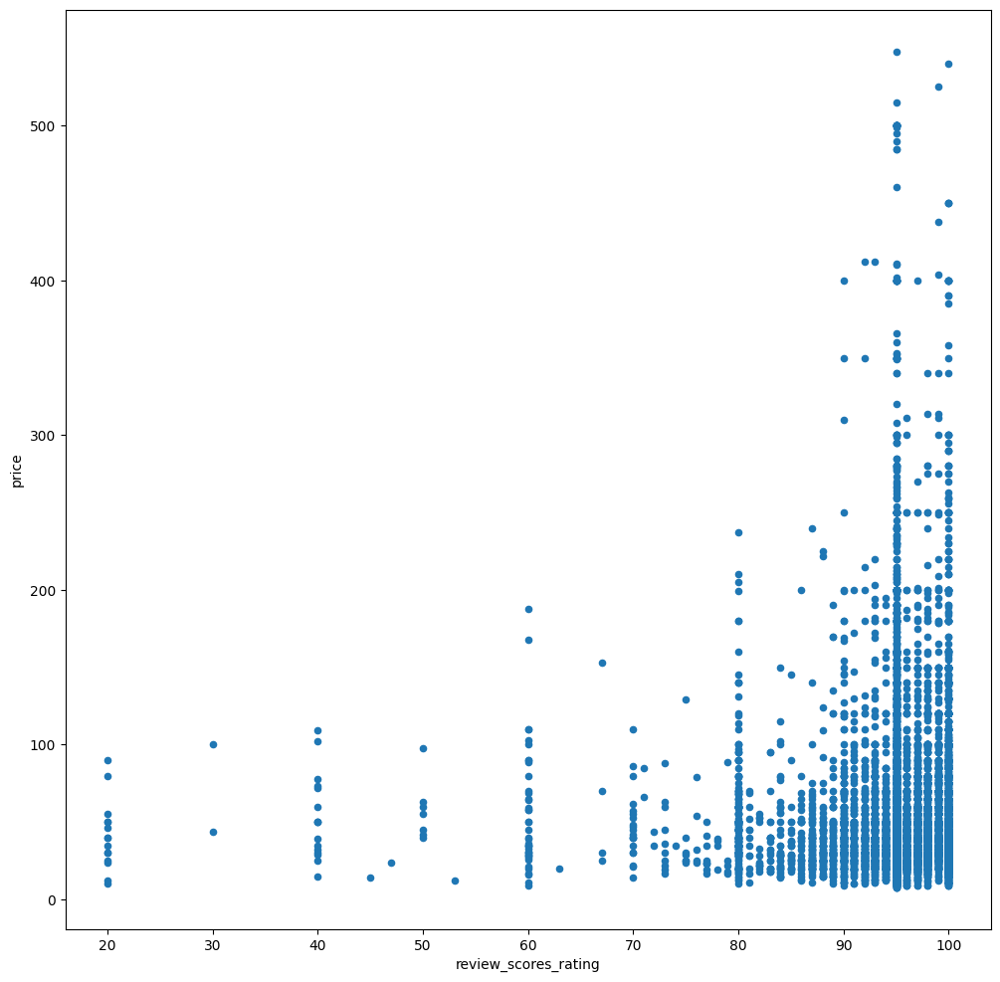

In [ ]:
price_rev = train_2019[['id', 'review_scores_rating', 'price']]
price_rev = price_rev.drop_duplicates(subset='id')
price_rev = price_rev.loc[(price_rev['price'] < 600)]

price_rev.plot.scatter(x='review_scores_rating', y='price', figsize=(12,12));

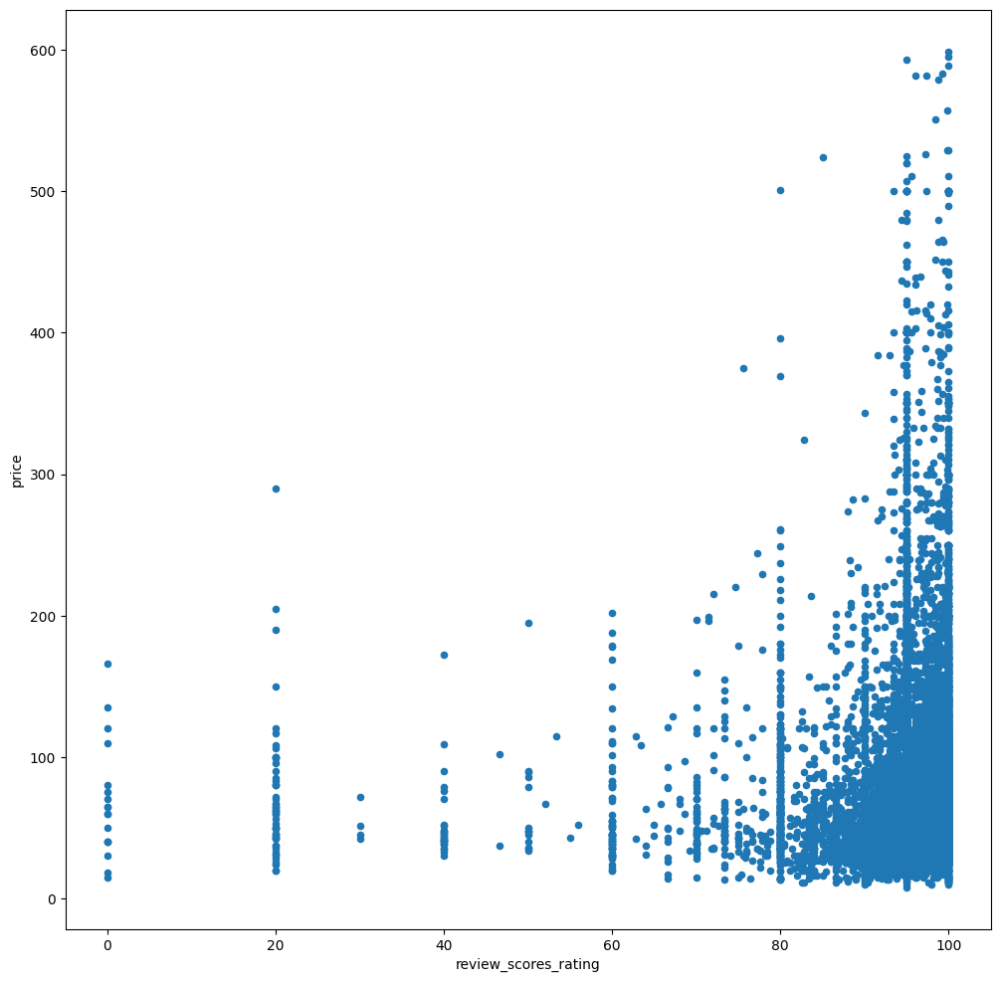

In [ ]:
price_rev = train_2023[['id', 'review_scores_rating', 'price']]
price_rev = price_rev.drop_duplicates(subset='id')
price_rev = price_rev.loc[(price_rev['price'] < 600)]

price_rev.plot.scatter(x='review_scores_rating', y='price', figsize=(12,12));

#1.14

In [ ]:
host = train_2019[['host_id', 'id']]
host = host.drop_duplicates(subset='id')


host = host.groupby('host_id').size()
host = pd.DataFrame(host, columns=['count'])

host = host.sort_values(by='count', ascending=False)
host.reset_index(inplace=True)

host.head(10)

,host_id,count
0,77457889,126
1,29927830,93
2,135482892,86
3,748818,80
4,1621474,72
5,1418201,63
6,112527018,57
7,65714690,48
8,2718115,46
9,2089542,45


In [ ]:
host = train_2023[['host_id', 'id']]
host = host.drop_duplicates(subset='id')


host = host.groupby('host_id').size()
host = pd.DataFrame(host, columns=['count'])

host = host.sort_values(by='count', ascending=False)
host.reset_index(inplace=True)

host.head(10)

,host_id,count
0,20104194,104
1,90390850,89
2,113548208,82
3,748818,75
4,182156346,65
5,29927830,64
6,2089542,59
7,407200868,54
8,47267002,53
9,114156592,53


#(1.15) ΣΥΜΠΕΡΑΣΜΑΤΑ


Από την παραπάνω ανάλυση και τη σύγκριση των δύο χρονιών, παρατηρούμε τα εξής:


*   Το Airbnb πρόσθεσε έναν ακόμη τύπο room_type (Hotel room) το οποίο όμως δεν ήταν ιδιαίτερα δημοφιλές, δεδομένου του χαρακτήρα της πλατφόρμας. Το πιο κοινό room type ήταν και παρέμεινε το entire home/apt.
*   Παρατηρείται ότι ο αριθμός κριτικών είναι σαφώς μεγαλύτερος σε όλες τς γειτονιές για το έτος 2023, καθώς η πλατφόρμα έγινε πιο δημιφιλής.
*   Ο αριθμός των γειτονιών καθώς και ο αριθμός καταχωρήσεων αυξήθηκαν το έτος 2023, και οι περισσότερες εντοπίζονται στην γειτονιά της Πλάκας.
*   Παρατηρούμε ότι η μέση τιμή καταλυμάτων σαφώς και αυξήθηκε ανάμεσα στα δύο έτη, ακόμα και στον κοινό μήνα των 2 ετών (Μάρτιο). Με την πιο ακριβή γειτονιά να παραμένει η Πλάκα.
*   Οι γειτονιές που στην ανάλυσή μας χαρακτηρίσαμε ως "φθηνές", εκλείπουν από το έτος 2023. Σε αντίθεση με τις ακριβές γειτονιές που πληθαίνουν.
*   Δεν παρατηρήθηκε ιδιαίτερη συσχέτιση μεταξύ της τιμής ενός δωματίου και της μέσης βαθμολογίας του στις κριτικές.
*   Τέλος, δεν υπάρχει κάποια σχέση του αριθμού των δωματίων ενός καταλύματος με την τιμή του.

#**Ερώτημα 2ο: Recommendation System**

---



In [60]:
import pandas as pd
import numpy as np
import sys

import string
import re
import nltk
nltk.download('wordnet')
from ast import literal_eval

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/data.zip

#Δημιουργία dataframe, καθάρισμα δεδομένων

In [61]:
def text_preparing(df, columnName, removeTags=False):
  # Αντικατάσταση NaN
  # NaN values are replaced with empty string
  df[columnName] = df[columnName].fillna('')  # or ' '

  # Απαλοιφή URL
  url_pattern = re.compile(r'https?://\S+|www\.\S+')  #Regex pattern for urls
  def removeURLs(text, replacement_text=' '):
      # erase urls
      text_without_urls = url_pattern.sub(replacement_text, text)
      return text_without_urls

  df[columnName] = df[columnName].apply(removeURLs)


  if removeTags:
    # # Απαλοιφή <br>, <b>
    br_pattern = re.compile(r'(<|&lt;)br\s*\/*(>|&gt;)')
    def removeBRs(text, replacement_text=' '):
      # erase <br>, <br/> etc...
      text_without_brs = br_pattern.sub(replacement_text, text)
      return text_without_brs

    b_pattern = re.compile(r'<\s*\/?\s*b\s*\/?\s*>')
    def removeBs(text, replacement_text=' '):
      # erase <br>, <b>, </b>, etc...
      text_without_bs = b_pattern.sub(replacement_text, text)
      return text_without_bs

    df[columnName] = df[columnName].apply(removeBRs)
    df[columnName] = df[columnName].apply(removeBs)


  # Αφαίρεση όλων των μη Λατινικών χαρακτήρων
  # Define the regular expression to match non-English letters
  # regex = re.compile(r'[^a-zA-Z\s]')
  regex = re.compile(r'[^a-zA-Z\sα-ωΑ-Ω άέίόήύώΈΎΊΌΆΉΏ]') ##################

  # Remove all characters except English letters
  df[columnName] = df[columnName].apply(lambda x: regex.sub(' ', x) if isinstance(x, str) else x)


  ##################################
  # Αφαίρεση τόνων
  import unicodedata

  def remove_diacritics(text):
      return ''.join(c for c in unicodedata.normalize('NFD', text) if unicodedata.category(c) != 'Mn')

  # Apply diacritics removal to each row in the DataFrame
  df[columnName] = df[columnName].apply(remove_diacritics)
  #######################################

  # # Αφαίρεση περιττών κενών
  df[columnName] = df[columnName].str.replace(r'\s+', ' ', regex=True)

  # Μετατροπή σε πεζά
  df[columnName] = df[columnName].str.lower()

In [62]:
lis_23_mar = pd.read_csv('data/2023/march/listings.csv')
lis_23_jun = pd.read_csv('data/2023/june/listings.csv')
lis_23_sep = pd.read_csv('data/2023/september/listings.csv')

target_columns23 = ["id","name","description"]

In [63]:
#RESET 2023
text_2023 = pd.concat([lis_23_mar, lis_23_jun, lis_23_sep], ignore_index=True)
text_2023 = text_2023[target_columns23] # Keep only the columns needed for later analysis

In [64]:
text_2023 = text_2023.drop_duplicates(subset=["name", "description"])
text_2023 = text_2023.drop_duplicates(subset=["id"])

text_2023 = text_2023.sort_values(by="id")

In [65]:
text_2023['id'].isna().sum() # no NaN
text_2023['name'].fillna('', inplace=True)
text_2023['description'].fillna('', inplace=True)

In [66]:
text_2023['text'] = text_2023['name'] + ' ' + text_2023['description']
text_2023 = text_2023.reset_index(drop=True)
text_preparing(text_2023, 'text', True)

#2.1

In [67]:
text_2023_reduced = text_2023.sample(round(text_2023.shape[0] * (0.25)))   # Take a fraction of the data
text_2023_reduced.shape

(3572, 4)

In [68]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_df=1.0, min_df=1, max_features=1000, stop_words=stopEnglish, ngram_range=(1,2))  # unigrams and bigrams
tfidf = tfidf_vectorizer.fit_transform(text_2023['text'])

tfidf_df = pd.DataFrame(tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ain', 'daren', 'hadn', 'herse', 'himse', 'itse', 'mayn', 'mightn', 'mon', 'mustn', 'myse', 'needn', 'oughtn', 'shan'] not in stop_words.
  warnings.warn(


#2.2

Δημιουργία λίστας αντί για dictionary. Η λίστα περιέχει τριπλέτες του τύπου: (id_0, id_1, similarity)

In [69]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_df=1.0, min_df=1, max_features=1000, stop_words=stopEnglish, ngram_range=(1,2))  # unigrams and bigrams
tfidf = tfidf_vectorizer.fit_transform(text_2023_reduced['text'])

tfidf_df = pd.DataFrame(tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

from sklearn.metrics.pairwise import cosine_similarity

similarities = cosine_similarity(tfidf)

similarity_df = pd.DataFrame(similarities, index=text_2023_reduced['id'], columns=text_2023_reduced['id'])  # Turn cosine similarity matrix to a dataframe
similarity_df.reset_index(drop=True)

allSimilarities = []  # A list with all the triplets of (id_0, id_1, similarity) each only once
for i in text_2023_reduced['id']:
  for j in text_2023_reduced['id']:
    if i != j:  # Dont include the similarity with an id with itself
      tmp = []
      tmp.append(i)
      tmp.append(j)
      tmp.append(similarity_df.loc[i][j])
      allSimilarities.append(tuple(tmp))

allSimilarities = sorted(allSimilarities, key=lambda x: x[2], reverse=True) # Sort according to the similarity

unique_pairs = set()
# Iterate through each pair in the list
for pair in allSimilarities:
    # Sort the pair to ensure (id_0, id_1, similarity) and (id_1, id_0, similarity) are the same
    sorted_pair = tuple(sorted(pair[:2]))
    unique_pairs.add((sorted_pair, pair[2]))

# Convert the set of unique pairs back to a list
allSimilarities = [(pair[0][0], pair[0][1], pair[1]) for pair in unique_pairs]

allSimilarities = sorted(allSimilarities, key=lambda x: x[2], reverse=True)
allSimilarities = allSimilarities[:100] # take the first 100 most similar

/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:409: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ain', 'daren', 'hadn', 'herse', 'himse', 'itse', 'mayn', 'mightn', 'mon', 'mustn', 'myse', 'needn', 'oughtn', 'shan'] not in stop_words.
  warnings.warn(


100 most similar

In [70]:
allSimilarities

[(848487170278981551, 860055317781722671, 1.0000000000000004),
 (848552763581562806, 860055317781722671, 1.0000000000000004),
 (848511142987819656, 860055317781722671, 1.0000000000000004),
 (30097087, 30917113, 1.0000000000000004),
 (848552763581562806, 860072355224802343, 1.0000000000000004),
 (848511142987819656, 860072355224802343, 1.0000000000000004),
 (848511142987819656, 848552763581562806, 1.0000000000000004),
 (860055317781722671, 860072355224802343, 1.0000000000000004),
 (848511142987819656, 848533800462801800, 1.0000000000000004),
 (848487170278981551, 860072355224802343, 1.0000000000000004),
 (848487170278981551, 848552763581562806, 1.0000000000000004),
 (675873969045367524, 676490865327499927, 1.0000000000000004),
 (848533800462801800, 860055317781722671, 1.0000000000000004),
 (848487170278981551, 848511142987819656, 1.0000000000000004),
 (848533800462801800, 860072355224802343, 1.0000000000000004),
 (848533800462801800, 848552763581562806, 1.0000000000000004),
 (8484871702

#2.3

In [71]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(max_df=1.0, min_df=1, max_features=1000, stop_words='english', ngram_range=(1,2))  # unigrams and bigrams
tfidf = tfidf_vectorizer.fit_transform(text_2023['text'])

tfidf_df = pd.DataFrame(tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

from sklearn.metrics.pairwise import cosine_similarity

similarities = cosine_similarity(tfidf)
similarity_df = pd.DataFrame(similarities, index=text_2023['id'], columns=text_2023['id'])
# similarity_df.reset_index(drop=True)

In [72]:
def recommend(item_id = 4085493, num = 5):
  if item_id not in text_2023['id'].values:
    print(item_id,'does not exist')
    return

  pd.set_option('display.max_colwidth', None)

  recommendations = []  # List with the 'num' recommendations
  for col_name, value in similarity_df.loc[item_id].items():
    rec = []
    rec.append(col_name)  # column name is the id of the recommended listing
    rec.append(value) # the similarity
    rec = list(rec)
    recommendations.append(rec)

  recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True) # sort by similarity
  recommendations.pop(0)

  if num>len(recommendations):  # if number given is greater that the table size, chage it to max possible value
    num = len(recommendations)

  print('Recommending', num, 'listings similar to Studio')
  print('-----------------------------------------------')
  for i in range(0,num):
    id = recommendations[i][0]  # recommended listing id
    item = text_2023.loc[text_2023['id'] == id] # get the actual row from the dataframe
    print('Recommended:', item['name'].to_string())
    print('Description:', item['description'].to_string())
    print('( score:', recommendations[i][1],')')

  pd.reset_option('display.max_colwidth')

In [73]:
recommend(item_id=32122730, num=10)

Recommending 10 listings similar to Studio
-----------------------------------------------
Recommended: 5646    Spacious Apartment @Acropolis Museum
Description: 5646    A modest and comfortable apartment set in the heart of Athens, two minutes walk away from the famous D. Areopagitou pedestrian street right under Acropolis.<br /><br /><b>License number</b><br />00001873194
( score: 0.630519171281112 )
Recommended: 6708    Heart of Athens
Description: 6708    <b>License number</b><br />00001053444
( score: 0.348679814900874 )
Recommended: 7084    Athens Raise Acropolis Project Suite 63
Description: 7084    One bedroom suite in the heart of Athens 3 minutes walk from metro station and Acropolis Museum<br /><br /><b>License number</b><br />00001269586
( score: 0.3468145635511194 )
Recommended: 860    A for Akropolis studio in Plaka, pedestrian view!!
Description: 860    Our tastefully renovated studio apartment is perfectly located in the heart of Plaka, right next to the Acropolis by th

#2.4

In [76]:
text_normalization(text_2023, 'text') # Defined in the top of the notebook

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [77]:
import nltk
from nltk.collocations import *
from nltk.metrics import BigramAssocMeasures

bigram_measures = nltk.collocations.BigramAssocMeasures()

allWords = [] # Create a big list of all the words
for row in text_2023.iterrows():
  allWords += row[1][3] # column 'text'

finder = BigramCollocationFinder.from_words(allWords)

# frequency distribution of bigrams
bigram_freq_dist = finder.ngram_fd
sorted_bigrams = sorted(bigram_freq_dist.items(), key=lambda item: item[1], reverse=True) # sort by frequency
for bigram, freq in sorted_bigrams[:10]:  # print the top 10 and frequencies
    print(bigram, freq)

('metro', 'station') 4250
('guest', 'access') 3545
('double', 'bed') 3305
('equipped', 'kitchen') 2922
('bedroom', 'bed') 2850
('bed', 'bath') 2803
('athina', 'bedroom') 2654
('heart', 'athens') 2600
('center', 'athens') 2500
('walking', 'distance') 2419
